<a href="https://colab.research.google.com/github/andrewabeles/loan_prediction/blob/main/ADS_505_Team_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Packages

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn.metrics import mean_squared_error, classification_report, plot_roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
import sqlite3
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
!pip install dmba
!pip install kds
import kds
from dmba import classificationSummary, liftChart, gainsChart
from dmba import plotDecisionTree

!pip install --upgrade impedance # this fixes the "no display found. Using non-interactive Agg backend" error

     |████████████████████████████████| 11.8 MB 149 kB/s 
no display found. Using non-interactive Agg backend
     |████████████████████████████████| 46 kB 2.7 MB/s 


# Load Data

In [2]:
from google.colab import drive
drive.mount('/content/drive/') 

Mounted at /content/drive/


In [3]:
df = pd.read_csv('/content/drive/Shared drives/ADS505/application_train.csv', engine='python')

In [4]:
df.shape

(307511, 122)

# Prepare Data

## Handle Nulls

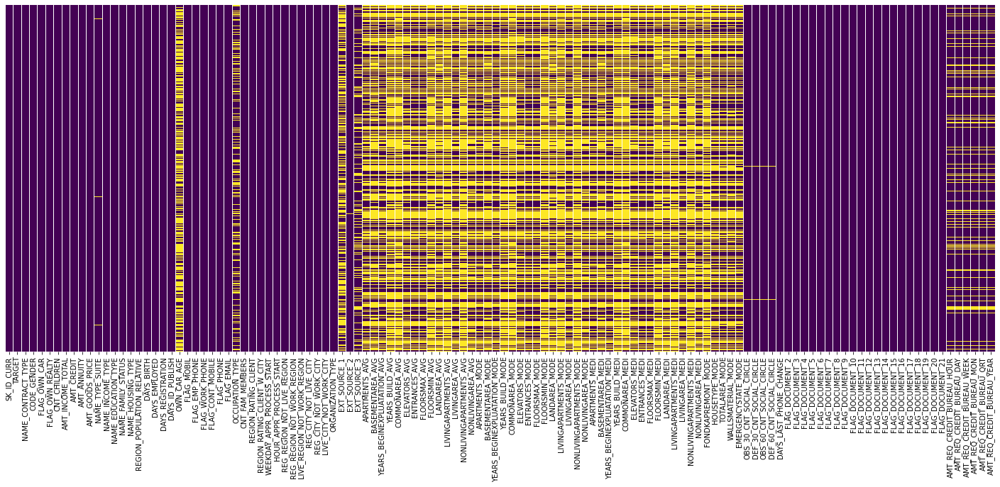

In [ ]:
# Plot null data with yellow lines
plt.figure(figsize=(25,9))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [5]:
# load dataframe into SQL
cnn = sqlite3.connect('ads505.db')

df.to_sql("df", cnn, if_exists='replace')

In [6]:
# load sql extension and connect to database
%load_ext sql
%sql sqlite:///ads505.db

'Connected: @ads505.db'

In [7]:
# column names with total null value rows
null_columns = df.columns[df.isnull().any()]
nulls = df[null_columns].isnull().sum()

# into database
nulls.to_sql("nulls", cnn, if_exists='replace')

In [8]:
## columns to consider dropping, missing 20% or more data
%%sql

select a.*
from (
  select [index] as 'Column', [0] as TotalNulls
  , printf("%.2f",cast([0] as float) / (select count(*) from df)) as NullPct
  from nulls 
    ) as a
where cast(a.NullPct as float) >= .2
order by 3 desc, 2 desc

 * sqlite:///ads505.db
Done.


Column,TotalNulls,NullPct
COMMONAREA_AVG,214865,0.70
COMMONAREA_MODE,214865,0.70
COMMONAREA_MEDI,214865,0.70
NONLIVINGAPARTMENTS_AVG,213514,0.69
NONLIVINGAPARTMENTS_MODE,213514,0.69
NONLIVINGAPARTMENTS_MEDI,213514,0.69
FONDKAPREMONT_MODE,210295,0.68
LIVINGAPARTMENTS_AVG,210199,0.68
LIVINGAPARTMENTS_MODE,210199,0.68
LIVINGAPARTMENTS_MEDI,210199,0.68


In [9]:
## Python code to drop columns
%%sql

select 'df.drop(''' || a.column || ''',axis=1, inplace=True)' CodeToDropColumns
from (
  select [index] as 'Column', [0] as TotalNulls
  , printf("%.2f",cast([0] as float) / (select count(*) from df)) as NullPct
  from nulls 
    ) as a
where cast(a.NullPct as float) >= .2
order by a.column

 * sqlite:///ads505.db
Done.


CodeToDropColumns
"df.drop('APARTMENTS_AVG',axis=1, inplace=True)"
"df.drop('APARTMENTS_MEDI',axis=1, inplace=True)"
"df.drop('APARTMENTS_MODE',axis=1, inplace=True)"
"df.drop('BASEMENTAREA_AVG',axis=1, inplace=True)"
"df.drop('BASEMENTAREA_MEDI',axis=1, inplace=True)"
"df.drop('BASEMENTAREA_MODE',axis=1, inplace=True)"
"df.drop('COMMONAREA_AVG',axis=1, inplace=True)"
"df.drop('COMMONAREA_MEDI',axis=1, inplace=True)"
"df.drop('COMMONAREA_MODE',axis=1, inplace=True)"
"df.drop('ELEVATORS_AVG',axis=1, inplace=True)"


In [10]:
df.drop('APARTMENTS_AVG',axis=1, inplace=True)
df.drop('APARTMENTS_MEDI',axis=1, inplace=True)
df.drop('APARTMENTS_MODE',axis=1, inplace=True)
df.drop('BASEMENTAREA_AVG',axis=1, inplace=True)
df.drop('BASEMENTAREA_MEDI',axis=1, inplace=True)
df.drop('BASEMENTAREA_MODE',axis=1, inplace=True)
df.drop('COMMONAREA_AVG',axis=1, inplace=True)
df.drop('COMMONAREA_MEDI',axis=1, inplace=True)
df.drop('COMMONAREA_MODE',axis=1, inplace=True)
df.drop('ELEVATORS_AVG',axis=1, inplace=True)
df.drop('ELEVATORS_MEDI',axis=1, inplace=True)
df.drop('ELEVATORS_MODE',axis=1, inplace=True)
df.drop('EMERGENCYSTATE_MODE',axis=1, inplace=True)
df.drop('ENTRANCES_AVG',axis=1, inplace=True)
df.drop('ENTRANCES_MEDI',axis=1, inplace=True)
df.drop('ENTRANCES_MODE',axis=1, inplace=True)
df.drop('EXT_SOURCE_1',axis=1, inplace=True)
df.drop('EXT_SOURCE_3',axis=1, inplace=True)
df.drop('FLOORSMAX_AVG',axis=1, inplace=True)
df.drop('FLOORSMAX_MEDI',axis=1, inplace=True)
df.drop('FLOORSMAX_MODE',axis=1, inplace=True)
df.drop('FLOORSMIN_AVG',axis=1, inplace=True)
df.drop('FLOORSMIN_MEDI',axis=1, inplace=True)
df.drop('FLOORSMIN_MODE',axis=1, inplace=True)
df.drop('FONDKAPREMONT_MODE',axis=1, inplace=True)
df.drop('HOUSETYPE_MODE',axis=1, inplace=True)
df.drop('LANDAREA_AVG',axis=1, inplace=True)
df.drop('LANDAREA_MEDI',axis=1, inplace=True)
df.drop('LANDAREA_MODE',axis=1, inplace=True)
df.drop('LIVINGAPARTMENTS_AVG',axis=1, inplace=True)
df.drop('LIVINGAPARTMENTS_MEDI',axis=1, inplace=True)
df.drop('LIVINGAPARTMENTS_MODE',axis=1, inplace=True)
df.drop('LIVINGAREA_AVG',axis=1, inplace=True)
df.drop('LIVINGAREA_MEDI',axis=1, inplace=True)
df.drop('LIVINGAREA_MODE',axis=1, inplace=True)
df.drop('NONLIVINGAPARTMENTS_AVG',axis=1, inplace=True)
df.drop('NONLIVINGAPARTMENTS_MEDI',axis=1, inplace=True)
df.drop('NONLIVINGAPARTMENTS_MODE',axis=1, inplace=True)
df.drop('NONLIVINGAREA_AVG',axis=1, inplace=True)
df.drop('NONLIVINGAREA_MEDI',axis=1, inplace=True)
df.drop('NONLIVINGAREA_MODE',axis=1, inplace=True)
df.drop('OCCUPATION_TYPE',axis=1, inplace=True)
df.drop('OWN_CAR_AGE',axis=1, inplace=True)
df.drop('TOTALAREA_MODE',axis=1, inplace=True)
df.drop('WALLSMATERIAL_MODE',axis=1, inplace=True)
df.drop('YEARS_BEGINEXPLUATATION_AVG',axis=1, inplace=True)
df.drop('YEARS_BEGINEXPLUATATION_MEDI',axis=1, inplace=True)
df.drop('YEARS_BEGINEXPLUATATION_MODE',axis=1, inplace=True)
df.drop('YEARS_BUILD_AVG',axis=1, inplace=True)
df.drop('YEARS_BUILD_MEDI',axis=1, inplace=True)
df.drop('YEARS_BUILD_MODE',axis=1, inplace=True)

In [11]:
df.shape

(307511, 71)

In [12]:
# TARGET variable is not balanced
df.TARGET.value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

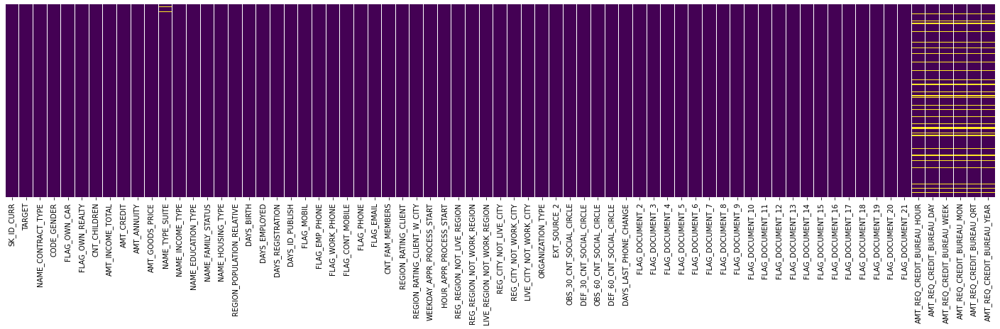

In [ ]:
# Plot null data with yellow lines.  This is after dropping columns
plt.figure(figsize=(25,5))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

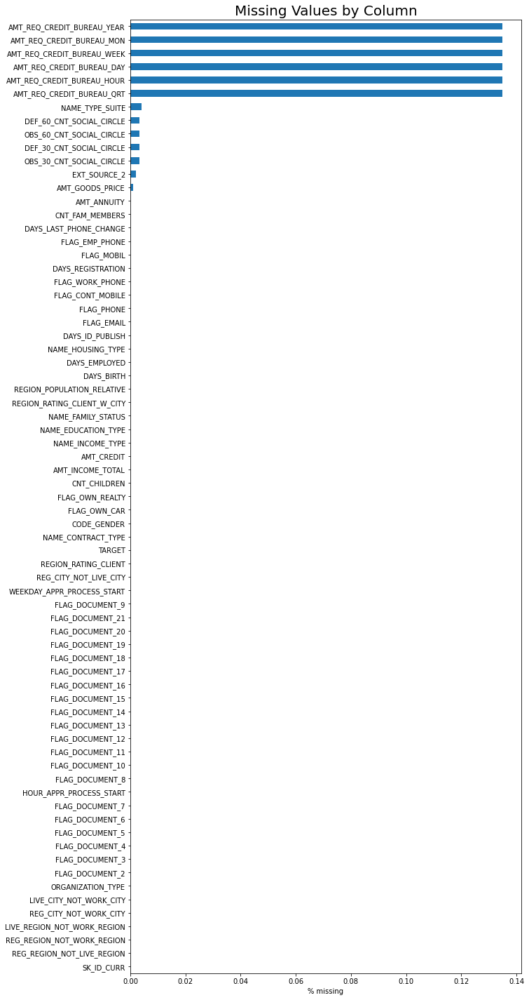

In [ ]:
fig, ax = plt.subplots(figsize=(10, 25))
ax = (df.isna().sum() / len(df)).sort_values().plot.barh()
ax.set_xlabel('% missing')
ax.set_title('Missing Values by Column', fontsize=20)
plt.show()

In [13]:
cols_with_nulls = list(df.columns[df.isna().sum() > 0])

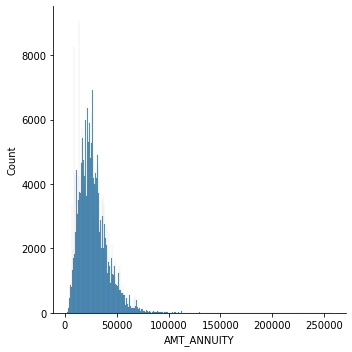

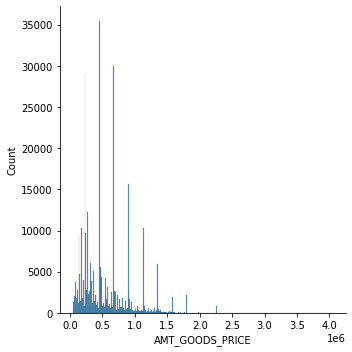

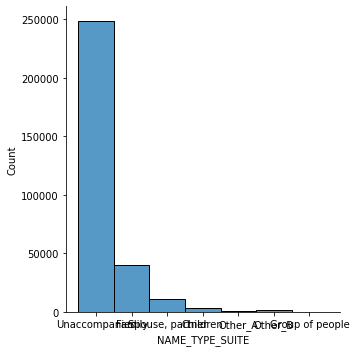

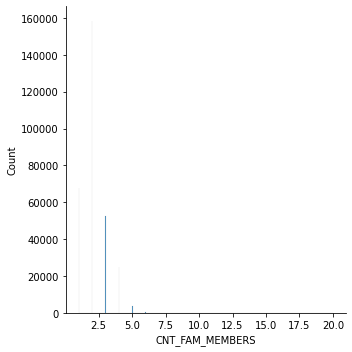

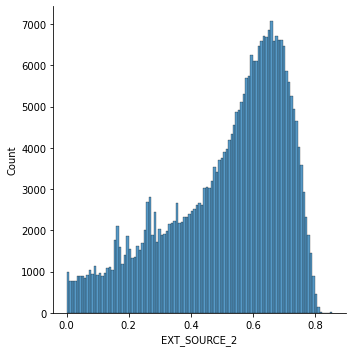

...

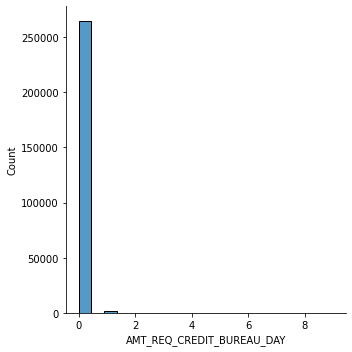

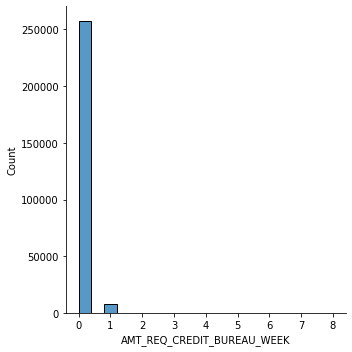

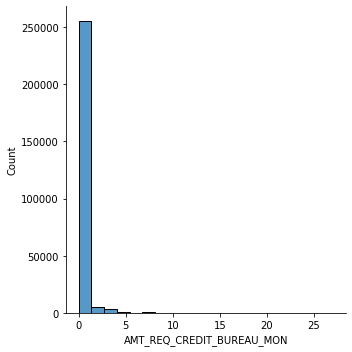

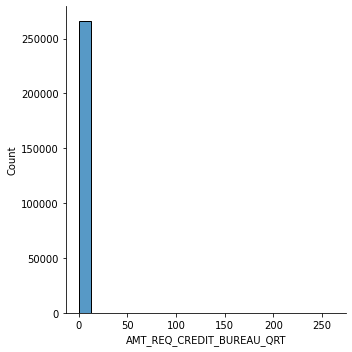

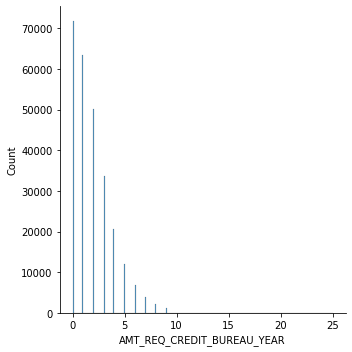

In [ ]:
# look at the distribution of each column with missing values
for col in cols_with_nulls:
  sns.displot(data=df, x=col)

In [14]:
# NAME_TYPE_SUITE is categorical so let's replace its nulls with its mode
df['NAME_TYPE_SUITE'].fillna('Unaccompanied', inplace=True)
# check to make sure there are no more nulls  
df['NAME_TYPE_SUITE'].isna().sum()

0

In [15]:
# all the distributions are skewed so let's impute with median instead of mean
df.fillna(df.median(), inplace=True)
# check to make sure there are no more nulls 
list(df.columns[df.isna().sum() > 0])

[]

## Dummify Categorical Variables

In [16]:
cat_cols = list(df.columns[df.dtypes == 'O'])
cat_cols

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

In [17]:
dummies = pd.get_dummies(df[cat_cols], prefix=cat_cols, drop_first=True)

In [18]:
df = pd.concat([df, dummies], axis=1).drop(columns=cat_cols)

## Create Balanced Sample

In [19]:
# the target classes are imbalanced
df['TARGET'].mean()

0.08072881945686496

In [20]:
# create df with all of the defaulted loans 
defaulted_df = df[df['TARGET'] == 1]
# create df with all of the repaid loans
repaid_df = df[df['TARGET'] == 0] 

In [21]:
# sample the number of defaulted loans from the repaid loans
repaid_sample = repaid_df.sample(n=len(defaulted_df), random_state=1)
len(defaulted_df) == len(repaid_sample)

True

In [22]:
# combine all of the defaulted loans with the sample of repaid loans 
balanced_df = pd.concat([defaulted_df, repaid_sample], axis=0)
balanced_df.shape

(49650, 155)

## Split Data into Train, Validation, and Test Sets

In [23]:
# set aside 20% of the balanced sample for testing the final model
df_train, df_test = train_test_split(balanced_df, test_size=0.2, random_state=1)
# set aside 20% of the training set for validating each model 
df_train, df_val = train_test_split(df_train, test_size=0.2, random_state=1)

## Normalize Data

In [24]:
# use min max scaling instead of standard scaling to handle skewed distributions
scaler = MinMaxScaler()
# fit the scaler on the training set 
scaler.fit(df_train)
# use the fitted scaler to transform the training, validation, and test sets
train = scaler.transform(df_train)
val = scaler.transform(df_val)
test = scaler.transform(df_test)

In [25]:
# change the datasets back into Pandas dataframes for convenience 
df_train = pd.DataFrame(train, columns=df_train.columns)
df_val = pd.DataFrame(val, columns=df_val.columns)
df_test = pd.DataFrame(test, columns=df_test.columns)

# Explore Data

## Correlations

In [26]:
corr_matrix = df_train.corr()

In [27]:
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

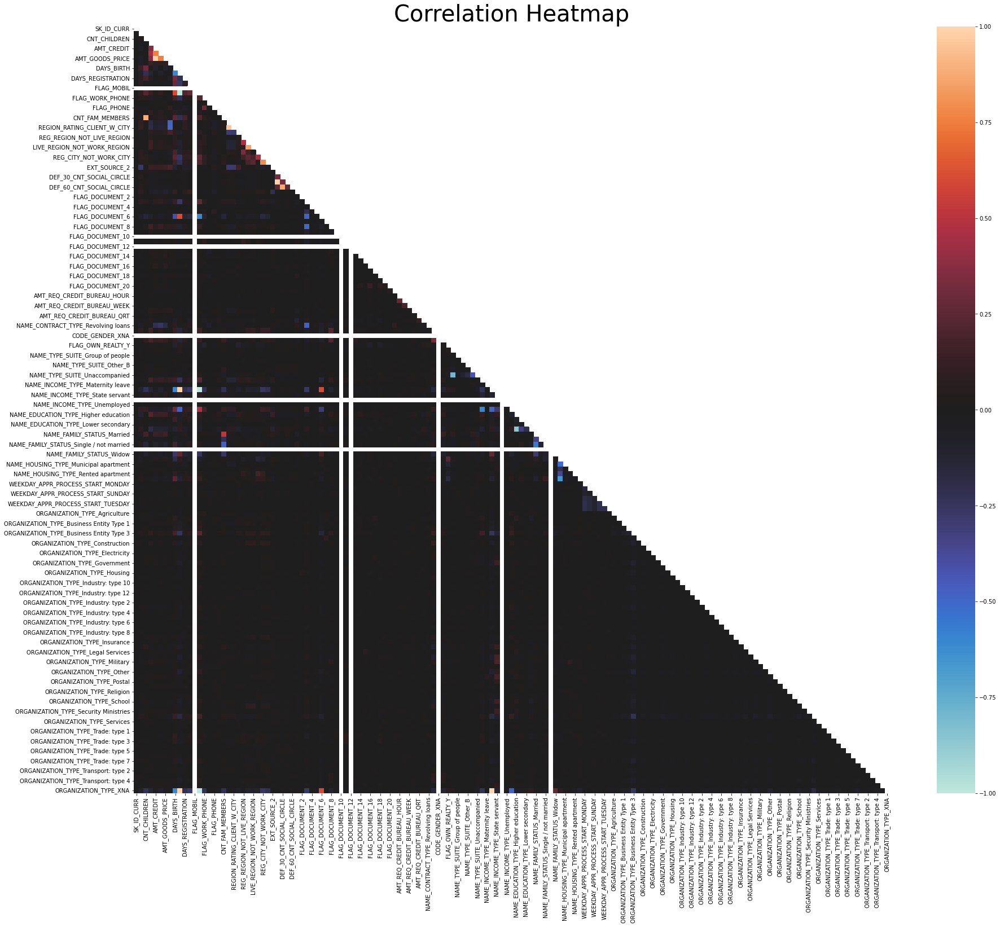

In [ ]:
fig, ax = plt.subplots(figsize=(30, 25))
ax = sns.heatmap(corr_matrix,
            mask=mask,
            vmin=-1,
            vmax=1,
            center=0
)
ax.set_title('Correlation Heatmap', fontsize=40)
plt.show()

In [28]:
corr_matrix['TARGET'].sort_values(ascending=False)

TARGET                         1.000000
DAYS_BIRTH                     0.143550
REGION_RATING_CLIENT_W_CITY    0.110916
REGION_RATING_CLIENT           0.107870
NAME_INCOME_TYPE_Working       0.102661
                                 ...   
FLAG_DOCUMENT_10                    NaN
FLAG_DOCUMENT_12                    NaN
CODE_GENDER_XNA                     NaN
NAME_INCOME_TYPE_Student            NaN
NAME_FAMILY_STATUS_Unknown          NaN
Name: TARGET, Length: 155, dtype: float64

## Mutual Information

In [ ]:
y = df_train['TARGET']
X = df_train.drop(columns=['TARGET'])

In [ ]:
mutual_info = mutual_info_classif(X, y, random_state=1)

In [ ]:
mutual_info_df = pd.DataFrame({
    'feature': X.columns,
    'mutual_info': mutual_info
}).sort_values('mutual_info', ascending=False)

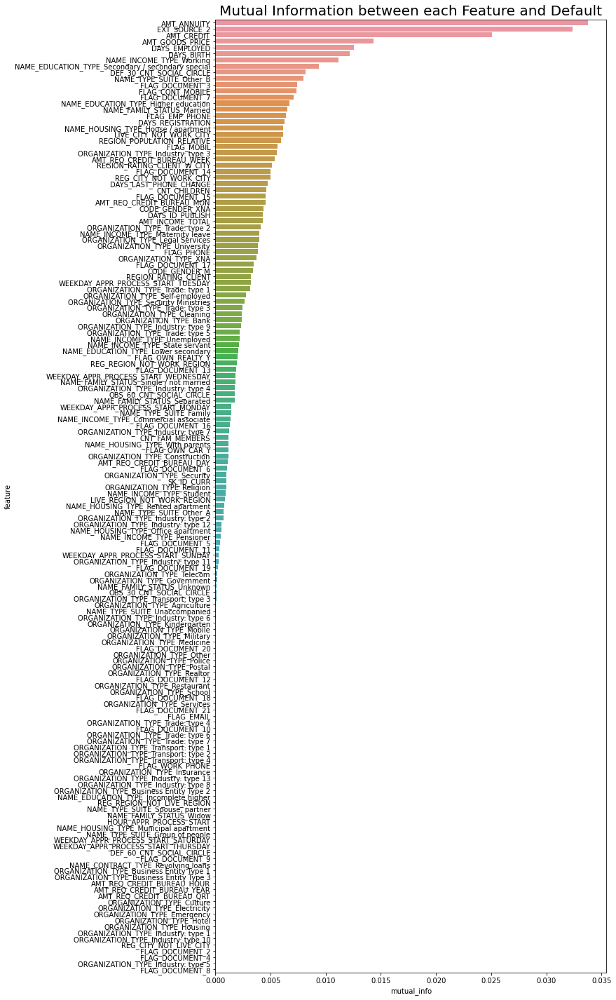

In [ ]:
fig, ax = plt.subplots(figsize=(10, 25))
ax = sns.barplot(
    data=mutual_info_df,
    y='feature',
    x='mutual_info',
    orient='h'
)
ax.set_title('Mutual Information between each Feature and Default', fontsize=20)
plt.show()

# Select Features

## Random Forest Feature Importance

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    df_train.drop(columns=['TARGET']),
    df_train['TARGET'], 
    test_size=0.2,
    stratify=df_train['TARGET'])
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((25420, 154), (6356, 154), (25420,), (6356,))

In [ ]:
# Random Forest
# Instantiate rf
rf = RandomForestClassifier(
    class_weight="balanced",
    random_state=2)# Define the dictionary 'params_rf'

In [ ]:
params_rf = {'n_estimators': [300, 500],
             'max_depth': [4, 6, 8],
             'max_features': ['log2', 'sqrt'],
             'criterion' :['gini', 'entropy'],
             'min_samples_leaf': [5, 10, 20]}

In [ ]:
# Instantiate grid_rf
grid_rf = GridSearchCV(estimator=rf,
                       param_grid=params_rf,
                       scoring='neg_mean_squared_error',
                       cv=5,
                       verbose=1,
                       n_jobs=-1)


In [ ]:
grid_rf.fit(X_train, y_train)
best_rf_model = grid_rf.best_estimator_
# it will take 35 minutes to run this code chunk

Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 31.8min finished


In [ ]:
# Predict test set labels
y_pred = best_rf_model.predict(X_test)

In [ ]:
# Compute rmse_test
rmse_test = mean_squared_error(y_test, y_pred)**(1/2)

In [ ]:
# Print rmse_test
# matplotlib
%matplotlib notebook
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as plt
plt.rcParams.update({'font.size': 50})
plt.rcParams['figure.figsize'] = [120, 120]

print('Test RMSE of best Random Forest model: {:.3f}'.format(rmse_test)) 
# Create a pd.Series of features importances
importances = pd.Series(data=best_rf_model.feature_importances_,
                        index= X_train.columns)

# Sort importances
importances_sorted = importances.sort_values()
# Draw a horizontal barplot of importances_sorted
importances_sorted.plot(kind='barh', color='lightgreen')

plt.title('Features Importances')
plt.show()


Test RMSE of best Random Forest model: 0.594


## Decision Tree Classifier Features Importance

In [ ]:
# Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV 
dt = DecisionTreeClassifier(class_weight="balanced", random_state=42)

In [ ]:
param_grid={
     'max_depth': [2, 3, 4],
     'max_leaf_nodes': [10, 20, 30], 
     'criterion' :['gini', 'entropy'],
     'min_samples_split': [2, 3, 4],
     'min_samples_leaf': [0.12, 0.14, 0.16, 0.18],
}
# Instantiate grid_dt
grid_dt = GridSearchCV(estimator = dt,
                       param_grid = param_grid,
                       scoring='neg_mean_squared_error',
                       cv=5,
                       verbose=1,
                       n_jobs=-1)
grid_dt.fit(X_train, y_train)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1080 out of 1080 | elapsed:  1.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'crit

In [ ]:
GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 4], 'max_leaf_nodes': [10, 20, 30],
                         'min_samples_leaf': [0.12, 0.14, 0.16, 0.18],
                         'min_samples_split': [2, 3, 4]},
             scoring='neg_mean_squared_error', verbose=1)


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'crit

In [ ]:
#decision tree features importance
best_dt_model = grid_dt.best_estimator_
# Predict test set labels
y_pred = best_dt_model.predict(X_test)

In [ ]:
# Compute rmse_test
rmse_test = mean_squared_error(y_test, y_pred)**(1/2)
# Print rmse_test
print('Test RMSE of best Decision Tree model: {:.3f}'.format(rmse_test))

Test RMSE of best Decision Tree model: 0.625


In [ ]:
# Create a pd.Series of features importances
importances = pd.Series(data=best_dt_model.feature_importances_,
                        index= X_train.columns)

In [ ]:
# Sort importances
importances_sorted = importances.sort_values()

In [ ]:
# Draw a horizontal barplot of importances_sorted
%matplotlib notebook
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size':50})
plt.rcParams['figure.figsize']=[120, 120]
importances_sorted.plot(kind='barh', color='lightgreen')
plt.title('Features Importances')
plt.show()

In [ ]:
# AdaBooster
# Instantiate dt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV 
dt = DecisionTreeClassifier(max_depth=3, random_state=1)



In [ ]:
# Instantiate ada
ada = AdaBoostClassifier(base_estimator=dt, n_estimators=500, random_state=1)
# Fit ada to the training set
ada.fit(X_train, y_train)


AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='gini',
                                                         max_depth=3,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort='deprecated',
                          

In [ ]:
# Compute the probabilities of obtaining the positive class
y_pred = ada.predict(X_test)

In [ ]:
# Compute rmse_test
rmse_test = mean_squared_error(y_test, y_pred)**(1/2)
# Print rmse_test
print('Test RMSE of AdaBooster model: {:.3f}'.format(rmse_test)) 

Test RMSE of AdaBooster model: 0.629


In [ ]:
# Create a pd.Series of features importances
importances = pd.Series(data=ada.feature_importances_,
                        index= X_train.columns)

In [ ]:

# Sort importances
importances_sorted = importances.sort_values()

In [ ]:
# Draw a horizontal barplot of importances_sorted
%matplotlib notebook
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size':50})
plt.rcParams['figure.figsize']=[120, 120]

importances_sorted.plot(kind='barh', color='lightgreen')
plt.title('AdaBoost Features Importances')
plt.show()

In [ ]:
# Gradient Boosting Classifier
# Instantiate gb
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, y_train, y_test = train_test_split(
    df_train.drop(columns=['TARGET']),
    df_train['TARGET'], 
    test_size=0.2,
    stratify=df_train['TARGET'])
X_train.shape, X_test.shape, y_train.shape, y_test.shape
gb = GradientBoostingClassifier(max_depth=6, 
            n_estimators=500,
            random_state=2)
# Fit gb to the training set
gb.fit(X_train, y_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=6,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=2, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:

# Predict test set labels
y_pred = gb.predict(X_test)

In [ ]:

# Predict test set labels
y_pred = gb.predict(X_test)

In [ ]:
# Compute rmse_test
rmse_test = mean_squared_error(y_test, y_pred)**(1/2)
# Print rmse_test
print('Test RMSE of Gradient Boosting: {:.3f}'.format(rmse_test))

Test RMSE of Gradient Boosting: 0.600


In [ ]:
# Create a pd.Series of features importances
importances = pd.Series(data=gb.feature_importances_,
                        index= X_train.columns)

In [ ]:
# Sort importances
importances_sorted = importances.sort_values()

In [ ]:
# Draw a horizontal barplot of importances_sorted
%matplotlib notebook
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size':50})
plt.rcParams['figure.figsize']=[120, 120]
importances_sorted.plot(kind='barh', color='lightgreen')
plt.title('Gradient Boosting Features Importances')
plt.show()

In [ ]:
# Stochastic Gradient Boosting Classifier Features Important
# Instantiate sgbr
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, y_train, y_test = train_test_split(
    df_train.drop(columns=['TARGET']),
    df_train['TARGET'], 
    test_size=0.2,
    stratify=df_train['TARGET'])
X_train.shape, X_test.shape, y_train.shape, y_test.shape
sgbc = GradientBoostingClassifier(max_depth=6, 
            subsample=0.9,
            max_features=0.75,
            n_estimators=500,                                
            random_state=2)
# Fit sgbr to the training set
sgbc.fit(X_train, y_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=6,
                           max_features=0.75, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=2, subsample=0.9, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
# Predict test set labels
y_pred = sgbc.predict(X_test)

In [ ]:
# Predict test set labels
y_pred = gb.predict(X_test)

In [ ]:
# Compute rmse_test
rmse_test = mean_squared_error(y_test, y_pred)**(1/2)
# Print rmse_test
print('Test RMSE of Stochastic Gradient Boosting: {:.3f}'.format(rmse_test)) 
# Create a pd.Series of features importances
importances = pd.Series(data=gb.feature_importances_,
                        index= X_train.columns)

Test RMSE of Stochastic Gradient Boosting: 0.369


In [ ]:
# Create a pd.Series of features importances
importances = pd.Series(data=gb.feature_importances_,
                        index= X_train.columns)

In [ ]:

# Sort importances
importances_sorted = importances.sort_values()


In [ ]:
# Draw a horizontal barplot of importances_sorted
%matplotlib notebook
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size':50})
plt.rcParams['figure.figsize']=[120, 120]
importances_sorted.plot(kind='barh', color='lightgreen')
plt.title('Features Importances')
plt.show()

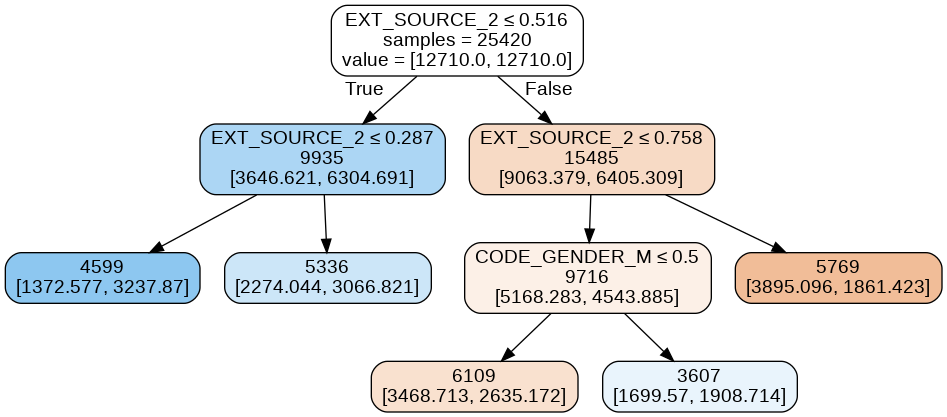

In [ ]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

# dmba
from dmba import classificationSummary, liftChart, gainsChart
from dmba import plotDecisionTree

from sklearn.tree import DecisionTreeClassifier, plot_tree
plotDecisionTree(best_dt_model, feature_names=X_train.columns)
# plotDecisionTree(best_rf_model, feature_names=X_train.columns)

EXT_SOURCE_2 (Normalized score from external data), DAYS_BIRTH(Client's age in days at the thime of application), AMT_ANNUITY(Loan Annuity),TARGET (Target variable(1- client with payment difficulties: he/she had late payment more than X days on at least on of the first Y installments of the loan in our sample, 0- all other cases)) , DAYS_EMPLOYED (How many days before the application the persons started current employment), DAYS_LAST_PHONE_CHANGE(How many days before application did client change phone)


## Principal Component Analysis

In [29]:
# Load correlation matrix data into SQL
corr_matrix.to_sql("corr_matrix", cnn, if_exists='replace')

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:2615: UserWarning: The spaces in these column names will not be changed. In pandas versions < 0.14, spaces were converted to underscores.
  method=method,


In [30]:
%%sql

select printf("%.3f", a.Average) as Average, a.Column
from (
select avg(SK_ID_CURR) as Average, 'SK_ID_CURR' as Column from corr_matrix union
select avg(TARGET) as Average, 'TARGET' as Column from corr_matrix union
select avg(CNT_CHILDREN) as Average, 'CNT_CHILDREN' as Column from corr_matrix union
select avg(AMT_INCOME_TOTAL) as Average, 'AMT_INCOME_TOTAL' as Column from corr_matrix union
select avg(AMT_CREDIT) as Average, 'AMT_CREDIT' as Column from corr_matrix union
select avg(AMT_ANNUITY) as Average, 'AMT_ANNUITY' as Column from corr_matrix union
select avg(AMT_GOODS_PRICE) as Average, 'AMT_GOODS_PRICE' as Column from corr_matrix union
select avg(REGION_POPULATION_RELATIVE) as Average, 'REGION_POPULATION_RELATIVE' as Column from corr_matrix union
select avg(DAYS_BIRTH) as Average, 'DAYS_BIRTH' as Column from corr_matrix union
select avg(DAYS_EMPLOYED) as Average, 'DAYS_EMPLOYED' as Column from corr_matrix union
select avg(DAYS_REGISTRATION) as Average, 'DAYS_REGISTRATION' as Column from corr_matrix union
select avg(DAYS_ID_PUBLISH) as Average, 'DAYS_ID_PUBLISH' as Column from corr_matrix union
select avg(FLAG_MOBIL) as Average, 'FLAG_MOBIL' as Column from corr_matrix union
select avg(FLAG_EMP_PHONE) as Average, 'FLAG_EMP_PHONE' as Column from corr_matrix union
select avg(FLAG_WORK_PHONE) as Average, 'FLAG_WORK_PHONE' as Column from corr_matrix union
select avg(FLAG_CONT_MOBILE) as Average, 'FLAG_CONT_MOBILE' as Column from corr_matrix union
select avg(FLAG_PHONE) as Average, 'FLAG_PHONE' as Column from corr_matrix union
select avg(FLAG_EMAIL) as Average, 'FLAG_EMAIL' as Column from corr_matrix union
select avg(CNT_FAM_MEMBERS) as Average, 'CNT_FAM_MEMBERS' as Column from corr_matrix union
select avg(REGION_RATING_CLIENT) as Average, 'REGION_RATING_CLIENT' as Column from corr_matrix union
select avg(REGION_RATING_CLIENT_W_CITY) as Average, 'REGION_RATING_CLIENT_W_CITY' as Column from corr_matrix union
select avg(HOUR_APPR_PROCESS_START) as Average, 'HOUR_APPR_PROCESS_START' as Column from corr_matrix union
select avg(REG_REGION_NOT_LIVE_REGION) as Average, 'REG_REGION_NOT_LIVE_REGION' as Column from corr_matrix union
select avg(REG_REGION_NOT_WORK_REGION) as Average, 'REG_REGION_NOT_WORK_REGION' as Column from corr_matrix union
select avg(LIVE_REGION_NOT_WORK_REGION) as Average, 'LIVE_REGION_NOT_WORK_REGION' as Column from corr_matrix union
select avg(REG_CITY_NOT_LIVE_CITY) as Average, 'REG_CITY_NOT_LIVE_CITY' as Column from corr_matrix union
select avg(REG_CITY_NOT_WORK_CITY) as Average, 'REG_CITY_NOT_WORK_CITY' as Column from corr_matrix union
select avg(LIVE_CITY_NOT_WORK_CITY) as Average, 'LIVE_CITY_NOT_WORK_CITY' as Column from corr_matrix union
select avg(EXT_SOURCE_2) as Average, 'EXT_SOURCE_2' as Column from corr_matrix union
select avg(OBS_30_CNT_SOCIAL_CIRCLE) as Average, 'OBS_30_CNT_SOCIAL_CIRCLE' as Column from corr_matrix union
select avg(DEF_30_CNT_SOCIAL_CIRCLE) as Average, 'DEF_30_CNT_SOCIAL_CIRCLE' as Column from corr_matrix union
select avg(OBS_60_CNT_SOCIAL_CIRCLE) as Average, 'OBS_60_CNT_SOCIAL_CIRCLE' as Column from corr_matrix union
select avg(DEF_60_CNT_SOCIAL_CIRCLE) as Average, 'DEF_60_CNT_SOCIAL_CIRCLE' as Column from corr_matrix union
select avg(DAYS_LAST_PHONE_CHANGE) as Average, 'DAYS_LAST_PHONE_CHANGE' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_2) as Average, 'FLAG_DOCUMENT_2' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_3) as Average, 'FLAG_DOCUMENT_3' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_4) as Average, 'FLAG_DOCUMENT_4' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_5) as Average, 'FLAG_DOCUMENT_5' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_6) as Average, 'FLAG_DOCUMENT_6' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_7) as Average, 'FLAG_DOCUMENT_7' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_8) as Average, 'FLAG_DOCUMENT_8' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_9) as Average, 'FLAG_DOCUMENT_9' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_10) as Average, 'FLAG_DOCUMENT_10' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_11) as Average, 'FLAG_DOCUMENT_11' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_12) as Average, 'FLAG_DOCUMENT_12' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_13) as Average, 'FLAG_DOCUMENT_13' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_14) as Average, 'FLAG_DOCUMENT_14' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_15) as Average, 'FLAG_DOCUMENT_15' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_16) as Average, 'FLAG_DOCUMENT_16' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_17) as Average, 'FLAG_DOCUMENT_17' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_18) as Average, 'FLAG_DOCUMENT_18' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_19) as Average, 'FLAG_DOCUMENT_19' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_20) as Average, 'FLAG_DOCUMENT_20' as Column from corr_matrix union
select avg(FLAG_DOCUMENT_21) as Average, 'FLAG_DOCUMENT_21' as Column from corr_matrix union
select avg(AMT_REQ_CREDIT_BUREAU_HOUR) as Average, 'AMT_REQ_CREDIT_BUREAU_HOUR' as Column from corr_matrix union
select avg(AMT_REQ_CREDIT_BUREAU_DAY) as Average, 'AMT_REQ_CREDIT_BUREAU_DAY' as Column from corr_matrix union
select avg(AMT_REQ_CREDIT_BUREAU_WEEK) as Average, 'AMT_REQ_CREDIT_BUREAU_WEEK' as Column from corr_matrix union
select avg(AMT_REQ_CREDIT_BUREAU_MON) as Average, 'AMT_REQ_CREDIT_BUREAU_MON' as Column from corr_matrix union
select avg(AMT_REQ_CREDIT_BUREAU_QRT) as Average, 'AMT_REQ_CREDIT_BUREAU_QRT' as Column from corr_matrix union
select avg(AMT_REQ_CREDIT_BUREAU_YEAR) as Average, 'AMT_REQ_CREDIT_BUREAU_YEAR' as Column from corr_matrix union
select avg([NAME_CONTRACT_TYPE_Revolving loans]) as Average, 'NAME_CONTRACT_TYPE_Revolving loans' as Column from corr_matrix union
select avg(CODE_GENDER_M) as Average, 'CODE_GENDER_M' as Column from corr_matrix union
select avg(CODE_GENDER_XNA) as Average, 'CODE_GENDER_XNA' as Column from corr_matrix union
select avg(FLAG_OWN_CAR_Y) as Average, 'FLAG_OWN_CAR_Y' as Column from corr_matrix union
select avg(FLAG_OWN_REALTY_Y) as Average, 'FLAG_OWN_REALTY_Y' as Column from corr_matrix union
select avg(NAME_TYPE_SUITE_Family) as Average, 'NAME_TYPE_SUITE_Family' as Column from corr_matrix union
select avg([NAME_TYPE_SUITE_Group of people]) as Average, 'NAME_TYPE_SUITE_Group of people' as Column from corr_matrix union
select avg(NAME_TYPE_SUITE_Other_A) as Average, 'NAME_TYPE_SUITE_Other_A' as Column from corr_matrix union
select avg(NAME_TYPE_SUITE_Other_B) as Average, 'NAME_TYPE_SUITE_Other_B' as Column from corr_matrix union
select avg([NAME_TYPE_SUITE_Spouse, partner]) as Average, 'NAME_TYPE_SUITE_Spouse partner' as Column from corr_matrix union
select avg(NAME_TYPE_SUITE_Unaccompanied) as Average, 'NAME_TYPE_SUITE_Unaccompanied' as Column from corr_matrix union
select avg([NAME_INCOME_TYPE_Commercial associate]) as Average, 'NAME_INCOME_TYPE_Commercial associate' as Column from corr_matrix union
select avg([NAME_INCOME_TYPE_Maternity leave]) as Average, 'NAME_INCOME_TYPE_Maternity leave' as Column from corr_matrix union
select avg(NAME_INCOME_TYPE_Pensioner) as Average, 'NAME_INCOME_TYPE_Pensioner' as Column from corr_matrix union
select avg([NAME_INCOME_TYPE_State servant]) as Average, 'NAME_INCOME_TYPE_State servant' as Column from corr_matrix union
select avg(NAME_INCOME_TYPE_Student) as Average, 'NAME_INCOME_TYPE_Student' as Column from corr_matrix union
select avg(NAME_INCOME_TYPE_Unemployed) as Average, 'NAME_INCOME_TYPE_Unemployed' as Column from corr_matrix union
select avg(NAME_INCOME_TYPE_Working) as Average, 'NAME_INCOME_TYPE_Working' as Column from corr_matrix union
select avg([NAME_EDUCATION_TYPE_Higher education]) as Average, 'NAME_EDUCATION_TYPE_Higher education' as Column from corr_matrix union
select avg([NAME_EDUCATION_TYPE_Incomplete higher]) as Average, 'NAME_EDUCATION_TYPE_Incomplete higher' as Column from corr_matrix union
select avg([NAME_EDUCATION_TYPE_Lower secondary]) as Average, 'NAME_EDUCATION_TYPE_Lower secondary' as Column from corr_matrix union
select avg([NAME_EDUCATION_TYPE_Secondary / secondary special]) as Average, 'NAME_EDUCATION_TYPE_Secondary / secondary special' as Column from corr_matrix union
select avg(NAME_FAMILY_STATUS_Married) as Average, 'NAME_FAMILY_STATUS_Married' as Column from corr_matrix union
select avg(NAME_FAMILY_STATUS_Separated) as Average, 'NAME_FAMILY_STATUS_Separated' as Column from corr_matrix union
select avg([NAME_FAMILY_STATUS_Single / not married]) as Average, 'NAME_FAMILY_STATUS_Single / not married' as Column from corr_matrix union
select avg(NAME_FAMILY_STATUS_Unknown) as Average, 'NAME_FAMILY_STATUS_Unknown' as Column from corr_matrix union
select avg(NAME_FAMILY_STATUS_Widow) as Average, 'NAME_FAMILY_STATUS_Widow' as Column from corr_matrix union
select avg([NAME_HOUSING_TYPE_House / apartment]) as Average, 'NAME_HOUSING_TYPE_House / apartment' as Column from corr_matrix union
select avg([NAME_HOUSING_TYPE_Municipal apartment]) as Average, 'NAME_HOUSING_TYPE_Municipal apartment' as Column from corr_matrix union
select avg([NAME_HOUSING_TYPE_Office apartment]) as Average, 'NAME_HOUSING_TYPE_Office apartment' as Column from corr_matrix union
select avg([NAME_HOUSING_TYPE_Rented apartment]) as Average, 'NAME_HOUSING_TYPE_Rented apartment' as Column from corr_matrix union
select avg([NAME_HOUSING_TYPE_With parents]) as Average, 'NAME_HOUSING_TYPE_With parents' as Column from corr_matrix union
select avg(WEEKDAY_APPR_PROCESS_START_MONDAY) as Average, 'WEEKDAY_APPR_PROCESS_START_MONDAY' as Column from corr_matrix union
select avg(WEEKDAY_APPR_PROCESS_START_SATURDAY) as Average, 'WEEKDAY_APPR_PROCESS_START_SATURDAY' as Column from corr_matrix union
select avg(WEEKDAY_APPR_PROCESS_START_SUNDAY) as Average, 'WEEKDAY_APPR_PROCESS_START_SUNDAY' as Column from corr_matrix union
select avg(WEEKDAY_APPR_PROCESS_START_THURSDAY) as Average, 'WEEKDAY_APPR_PROCESS_START_THURSDAY' as Column from corr_matrix union
select avg(WEEKDAY_APPR_PROCESS_START_TUESDAY) as Average, 'WEEKDAY_APPR_PROCESS_START_TUESDAY' as Column from corr_matrix union
select avg(WEEKDAY_APPR_PROCESS_START_WEDNESDAY) as Average, 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Agriculture) as Average, 'ORGANIZATION_TYPE_Agriculture' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Bank) as Average, 'ORGANIZATION_TYPE_Bank' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Business Entity Type 1]) as Average, 'ORGANIZATION_TYPE_Business Entity Type 1' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Business Entity Type 2]) as Average, 'ORGANIZATION_TYPE_Business Entity Type 2' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Business Entity Type 3]) as Average, 'ORGANIZATION_TYPE_Business Entity Type 3' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Cleaning) as Average, 'ORGANIZATION_TYPE_Cleaning' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Construction) as Average, 'ORGANIZATION_TYPE_Construction' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Culture) as Average, 'ORGANIZATION_TYPE_Culture' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Electricity) as Average, 'ORGANIZATION_TYPE_Electricity' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Emergency) as Average, 'ORGANIZATION_TYPE_Emergency' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Government) as Average, 'ORGANIZATION_TYPE_Government' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Hotel) as Average, 'ORGANIZATION_TYPE_Hotel' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Housing) as Average, 'ORGANIZATION_TYPE_Housing' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 1]) as Average, 'ORGANIZATION_TYPE_Industry: type 1' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 10]) as Average, 'ORGANIZATION_TYPE_Industry: type 10' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 11]) as Average, 'ORGANIZATION_TYPE_Industry: type 11' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 12]) as Average, 'ORGANIZATION_TYPE_Industry: type 12' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 13]) as Average, 'ORGANIZATION_TYPE_Industry: type 13' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 2]) as Average, 'ORGANIZATION_TYPE_Industry: type 2' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 3]) as Average, 'ORGANIZATION_TYPE_Industry: type 3' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 4]) as Average, 'ORGANIZATION_TYPE_Industry: type 4' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 5]) as Average, 'ORGANIZATION_TYPE_Industry: type 5' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 6]) as Average, 'ORGANIZATION_TYPE_Industry: type 6' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 7]) as Average, 'ORGANIZATION_TYPE_Industry: type 7' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 8]) as Average, 'ORGANIZATION_TYPE_Industry: type 8' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Industry: type 9]) as Average, 'ORGANIZATION_TYPE_Industry: type 9' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Insurance) as Average, 'ORGANIZATION_TYPE_Insurance' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Kindergarten) as Average, 'ORGANIZATION_TYPE_Kindergarten' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Legal Services]) as Average, 'ORGANIZATION_TYPE_Legal Services' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Medicine) as Average, 'ORGANIZATION_TYPE_Medicine' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Military) as Average, 'ORGANIZATION_TYPE_Military' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Mobile) as Average, 'ORGANIZATION_TYPE_Mobile' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Other) as Average, 'ORGANIZATION_TYPE_Other' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Police) as Average, 'ORGANIZATION_TYPE_Police' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Postal) as Average, 'ORGANIZATION_TYPE_Postal' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Realtor) as Average, 'ORGANIZATION_TYPE_Realtor' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Religion) as Average, 'ORGANIZATION_TYPE_Religion' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Restaurant) as Average, 'ORGANIZATION_TYPE_Restaurant' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_School) as Average, 'ORGANIZATION_TYPE_School' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Security) as Average, 'ORGANIZATION_TYPE_Security' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Security Ministries]) as Average, 'ORGANIZATION_TYPE_Security Ministries' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Self-employed]) as Average, 'ORGANIZATION_TYPE_Self-employed' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Services) as Average, 'ORGANIZATION_TYPE_Services' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_Telecom) as Average, 'ORGANIZATION_TYPE_Telecom' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Trade: type 1]) as Average, 'ORGANIZATION_TYPE_Trade: type 1' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Trade: type 2]) as Average, 'ORGANIZATION_TYPE_Trade: type 2' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Trade: type 3]) as Average, 'ORGANIZATION_TYPE_Trade: type 3' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Trade: type 4]) as Average, 'ORGANIZATION_TYPE_Trade: type 4' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Trade: type 5]) as Average, 'ORGANIZATION_TYPE_Trade: type 5' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Trade: type 6]) as Average, 'ORGANIZATION_TYPE_Trade: type 6' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Trade: type 7]) as Average, 'ORGANIZATION_TYPE_Trade: type 7' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Transport: type 1]) as Average, 'ORGANIZATION_TYPE_Transport: type 1' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Transport: type 2]) as Average, 'ORGANIZATION_TYPE_Transport: type 2' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Transport: type 3]) as Average, 'ORGANIZATION_TYPE_Transport: type 3' as Column from corr_matrix union
select avg([ORGANIZATION_TYPE_Transport: type 4]) as Average, 'ORGANIZATION_TYPE_Transport: type 4' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_University) as Average, 'ORGANIZATION_TYPE_University' as Column from corr_matrix union
select avg(ORGANIZATION_TYPE_XNA) as Average, 'ORGANIZATION_TYPE_XNA' as Column from corr_matrix
) as a
where a.Average >= .015
order by 1 desc



 * sqlite:///ads505.db
Done.


Average,Column
0.028,FLAG_EMP_PHONE
0.027,DAYS_BIRTH
0.026,REG_CITY_NOT_WORK_CITY
0.024,REG_REGION_NOT_WORK_REGION
0.023,AMT_GOODS_PRICE
0.023,AMT_ANNUITY
0.022,AMT_INCOME_TOTAL
0.022,AMT_CREDIT
0.021,LIVE_CITY_NOT_WORK_CITY
0.020,LIVE_REGION_NOT_WORK_REGION


In [43]:
# Subset from correlation matrix average greater than .015
varsOfInterest = df_train[['TARGET', 'FLAG_EMP_PHONE',
'DAYS_BIRTH' ,
'REG_CITY_NOT_WORK_CITY' ,
'REG_REGION_NOT_WORK_REGION' ,
'AMT_GOODS_PRICE' ,
'AMT_ANNUITY' ,
'AMT_INCOME_TOTAL' ,
'AMT_CREDIT' ,
'LIVE_CITY_NOT_WORK_CITY' ,
'LIVE_REGION_NOT_WORK_REGION' ,
'DAYS_REGISTRATION' ,
'FLAG_OWN_CAR_Y' ,
'CNT_CHILDREN' ,
'CODE_GENDER_M' ,
'OBS_30_CNT_SOCIAL_CIRCLE' ,
'REG_REGION_NOT_LIVE_REGION' ,
'OBS_60_CNT_SOCIAL_CIRCLE' ,
'CNT_FAM_MEMBERS' ,
'DEF_30_CNT_SOCIAL_CIRCLE' ,
'REG_CITY_NOT_LIVE_CITY']]

In [46]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
segmentation_std = scaler.fit_transform(varsOfInterest)

scaler.fit(varsOfInterest)

scaled_data = scaler.transform(varsOfInterest) # transform scaled data

In [47]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(segmentation_std)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [48]:
# Decide how many features we would like to keep based on cumulative variance plot
len(pca.explained_variance_ratio_)

21

In [49]:
# Preserve around 80% of the variance
len(pca.explained_variance_ratio_) - (len(pca.explained_variance_ratio_) * .8)

4.199999999999999

Text(0, 0.5, 'Cumulative Explained Variance')

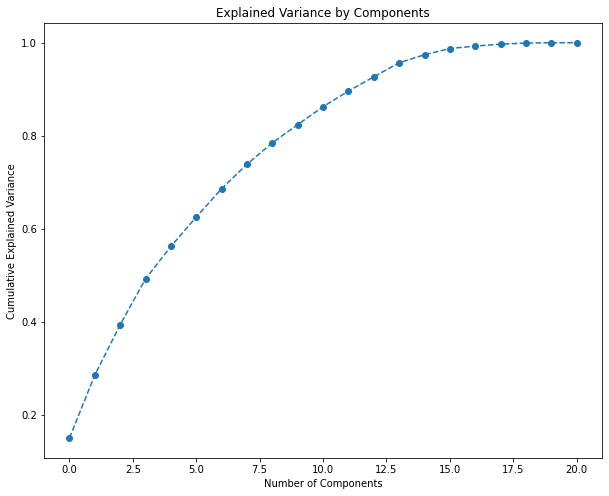

In [51]:
#pca1.explained_variance_ratio_
plt.figure(figsize=(10,8))
plt.plot(range(0,21), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.title("Explained Variance by Components")
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

In [52]:
# PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

pca.fit(scaled_data)

x_pca = pca.transform(scaled_data)

In [53]:
scaled_data.shape

(31776, 21)

In [54]:
x_pca.shape # can try feeding this reduced version of PCA, into a classification algorithm (e.g. Logistic Regression)

(31776, 2)

In [55]:
print('Variation by principal component 1 to ' + str(len(pca.explained_variance_ratio_)))
print(pca.explained_variance_ratio_)

Variation by principal component 1 to 2
[0.14949983 0.13544166]


Text(0, 0.5, 'Principal Component #2')

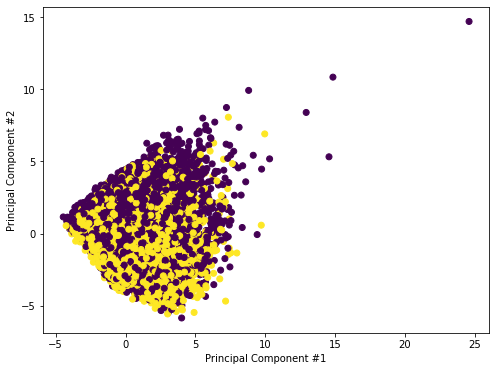

In [56]:
# Scatter plot of PCA, using TARGET as color
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0], x_pca[:,1], c=varsOfInterest.TARGET) #c = color
plt.xlabel('Principal Component #1')
plt.ylabel('Principal Component #2')

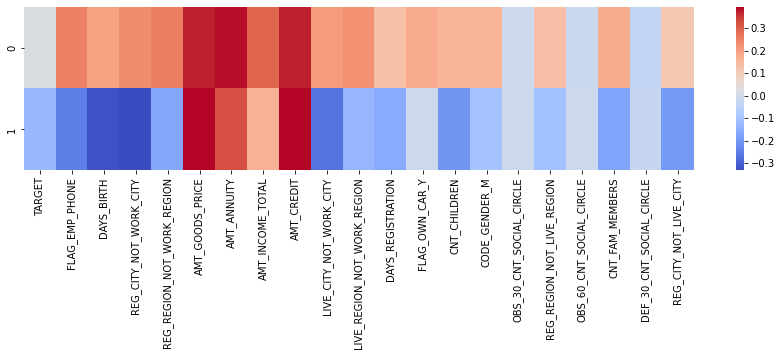

In [58]:
# Load PCA component into DataFrame
df_comp = pd.DataFrame(pca.components_, columns=varsOfInterest.columns)

# Heatmap of PCA components
plt.figure(figsize=(15,3))
sns.heatmap(df_comp, cmap='coolwarm')

# Modeling

## Logistic Regression

In [ ]:
lr = LogisticRegression(random_state=1)

In [ ]:
best_features = [
                 'EXT_SOURCE_2', 
                 'DAYS_BIRTH', 
                 'DAYS_EMPLOYED', 
                 'AMT_ANNUITY'
]

In [ ]:
y_train = df_train['TARGET']
y_val = df_val['TARGET']
y_test = df_test['TARGET']

In [ ]:
X_train = df_train[best_features]
X_val = df_val[best_features]
X_test = df_test[best_features]

In [ ]:
lr.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_pred_lr = lr.predict(X_val)

Confusion matrix:


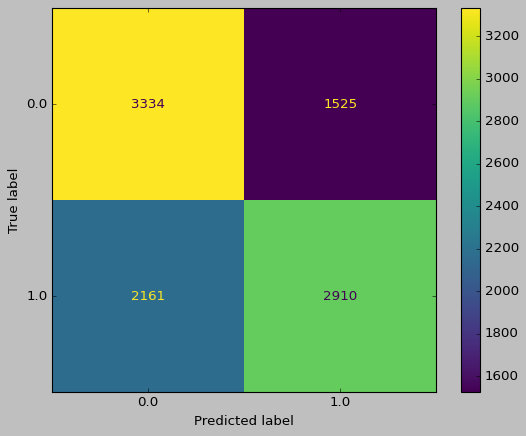

In [ ]:
from sklearn.metrics import plot_confusion_matrix
print('Confusion matrix:')
plot_confusion_matrix(lr, X_test, y_test,
                             values_format='d')
plt.style.use('classic')
def resize_image(src_img, size=(80,80), bg_color="white"): 
    from PIL import Image

plt.show()

In [ ]:
print(classification_report(y_val, y_pred_lr))

              precision    recall  f1-score   support

         0.0       0.61      0.67      0.64      3980
         1.0       0.63      0.57      0.60      3964

    accuracy                           0.62      7944
   macro avg       0.62      0.62      0.62      7944
weighted avg       0.62      0.62      0.62      7944



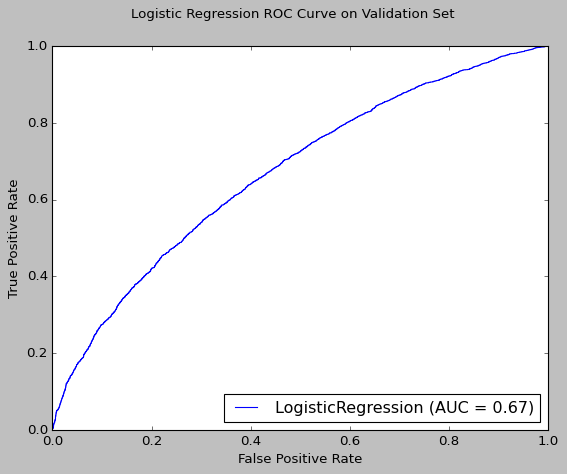

In [ ]:
lr_roc_plot = plot_roc_curve(lr, X_val, y_val)
lr_roc_plot.figure_.suptitle('Logistic Regression ROC Curve on Validation Set')
plt.style.use('classic')
def resize_image(src_img, size=(120,120), bg_color="white"): 
    from PIL import Image
plt.show()

## Random Forest


In [ ]:
rf = RandomForestClassifier(n_estimators=100)



In [ ]:
best_features = [ 'EXT_SOURCE_2', 
                 'DAYS_BIRTH', 
                 'DAYS_EMPLOYED', 
                 'AMT_ANNUITY'
                 
]

In [ ]:
y_train = df_train['TARGET']
y_val = df_val['TARGET']
y_test = df_test['TARGET']

In [ ]:
X_train = df_train[best_features]
X_val = df_val[best_features]
X_test = df_test[best_features]

In [ ]:
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
y_pred_rf = rf.predict(X_val)

Confusion matrix:


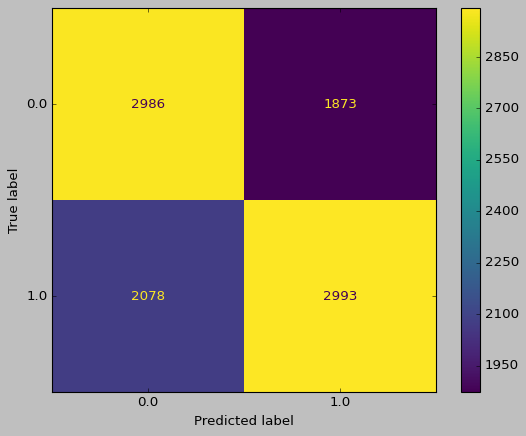

In [ ]:
# confusion matrix for validation set 
from sklearn.metrics import plot_confusion_matrix
print('Confusion matrix:')
plot_confusion_matrix(rf, X_test, y_test,
                             values_format='d')
plt.style.use('classic')
def resize_image(src_img, size=(64,64), bg_color="white"): 
    from PIL import Image

plt.show()

In [ ]:
print(classification_report(y_val, y_pred_rf))

              precision    recall  f1-score   support

         0.0       0.61      0.62      0.61      3980
         1.0       0.61      0.60      0.60      3964

    accuracy                           0.61      7944
   macro avg       0.61      0.61      0.61      7944
weighted avg       0.61      0.61      0.61      7944



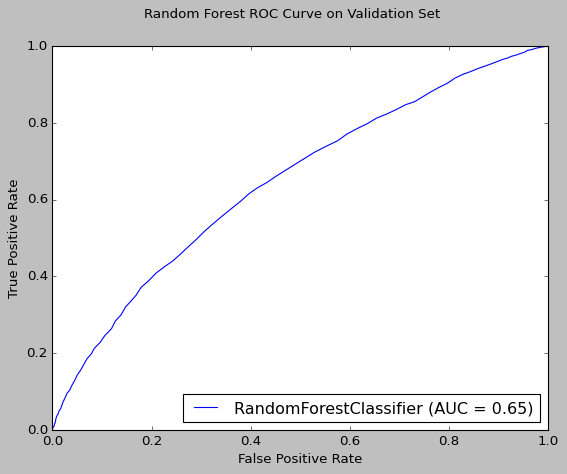

In [ ]:
rf_roc_plot = plot_roc_curve(rf, X_val, y_val)
rf_roc_plot.figure_.suptitle('Random Forest ROC Curve on Validation Set')
plt.style.use('classic')
def resize_image(src_img, size=(120,120), bg_color="white"): 
    from PIL import Image
plt.show()

## Stochastic Gradient Boosting Classifier

In [ ]:
# Stochastic Gradient Boosting Classifier
# Instantiate sgbr
from sklearn.ensemble import GradientBoostingClassifier
sgbc = GradientBoostingClassifier(max_depth=6, 
            subsample=0.9,
            max_features=0.75,
            n_estimators=500,                                
            random_state=2)
# Fit sgbr to the training set
sgbc.fit(X_train, y_train)


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=6,
                           max_features=0.75, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=2, subsample=0.9, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
y_pred_sgbc = sgbc.predict(X_val)

Confusion matrix:


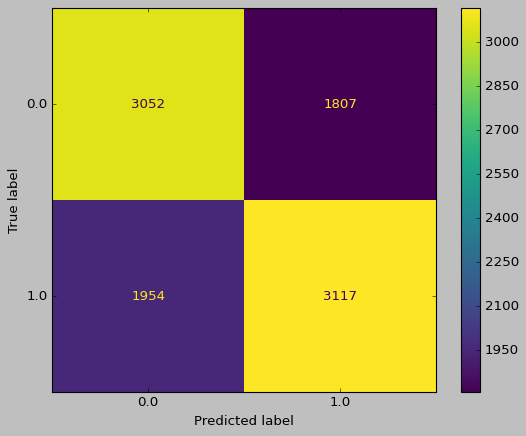

In [ ]:
from sklearn.metrics import plot_confusion_matrix
print('Confusion matrix:')
plot_confusion_matrix(sgbc, X_test, y_test,
                             values_format='d')
plt.style.use('classic')
def resize_image(src_img, size=(80,80), bg_color="white"): 
    from PIL import Image

plt.show()

In [ ]:
print(classification_report(y_val, y_pred_sgbc))

              precision    recall  f1-score   support

         0.0       0.62      0.63      0.63      3980
         1.0       0.62      0.61      0.62      3964

    accuracy                           0.62      7944
   macro avg       0.62      0.62      0.62      7944
weighted avg       0.62      0.62      0.62      7944



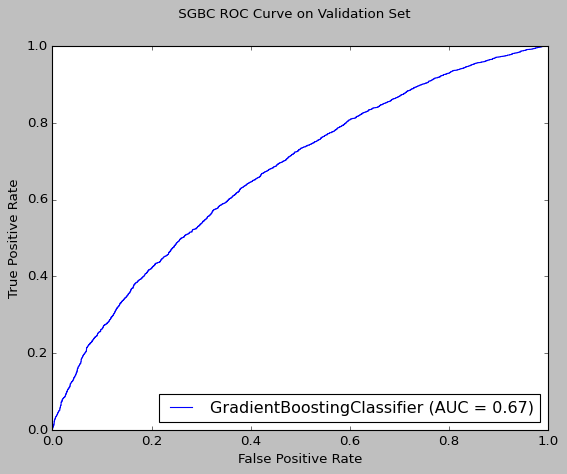

In [ ]:
sgbc_roc_plot = plot_roc_curve(sgbc, X_val, y_val)
sgbc_roc_plot.figure_.suptitle(' SGBC ROC Curve on Validation Set')
plt.style.use('classic')
def resize_image(src_img, size=(120,120), bg_color="white"): 
    from PIL import Image
plt.show()

## Neural Network

In [ ]:
from sklearn.neural_network import MLPClassifier

nn = MLPClassifier(hidden_layer_sizes=(10,), max_iter=100, alpha=1e-4,solver='adam', activation='logistic',verbose=10, 
                    random_state=1,learning_rate_init=.1)

In [ ]:
nn.fit(X_train, y_train)

Iteration 1, loss = 0.66182457
Iteration 2, loss = 0.65401044
Iteration 3, loss = 0.65328814
Iteration 4, loss = 0.65346264
Iteration 5, loss = 0.65285270
Iteration 6, loss = 0.65244936
Iteration 7, loss = 0.65246107
Iteration 8, loss = 0.65308890
Iteration 9, loss = 0.65226627
Iteration 10, loss = 0.65199309
Iteration 11, loss = 0.65204014
Iteration 12, loss = 0.65203296
Iteration 13, loss = 0.65216008
Iteration 14, loss = 0.65151386
Iteration 15, loss = 0.65130037
Iteration 16, loss = 0.65144782
Iteration 17, loss = 0.65147236
Iteration 18, loss = 0.65178673
Iteration 19, loss = 0.65151072
Iteration 20, loss = 0.65018913
Iteration 21, loss = 0.65202626
Iteration 22, loss = 0.65122169
Iteration 23, loss = 0.65099363
Iteration 24, loss = 0.65030095
Iteration 25, loss = 0.65129428
Iteration 26, loss = 0.65133789
Iteration 27, loss = 0.65156894
Iteration 28, loss = 0.65178658
Iteration 29, loss = 0.65165601
Iteration 30, loss = 0.65088384
Iteration 31, loss = 0.65058138
Training loss did

MLPClassifier(activation='logistic', alpha=0.0001, batch_size='auto',
              beta_1=0.9, beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(10,), learning_rate='constant',
              learning_rate_init=0.1, max_fun=15000, max_iter=100, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=1, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=10, warm_start=False)

In [ ]:
y_pred_nn = nn.predict(X_val)

Confusion matrix:


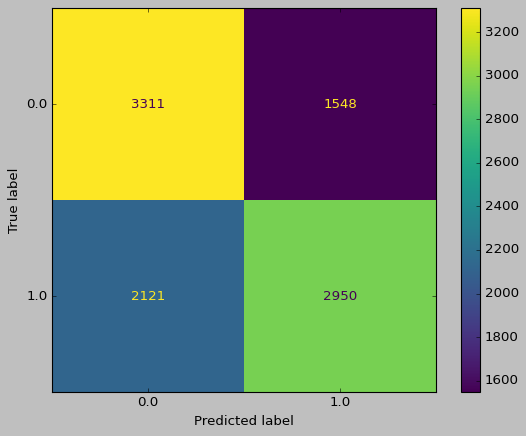

In [ ]:
from sklearn.metrics import plot_confusion_matrix
print('Confusion matrix:')
plot_confusion_matrix(nn, X_test, y_test,
                             values_format='d')
plt.style.use('classic')
def resize_image(src_img, size=(80,80), bg_color="white"): 
    from PIL import Image

plt.show()

In [ ]:
print(classification_report(y_val, y_pred_nn))

              precision    recall  f1-score   support

         0.0       0.61      0.66      0.64      3980
         1.0       0.63      0.58      0.60      3964

    accuracy                           0.62      7944
   macro avg       0.62      0.62      0.62      7944
weighted avg       0.62      0.62      0.62      7944



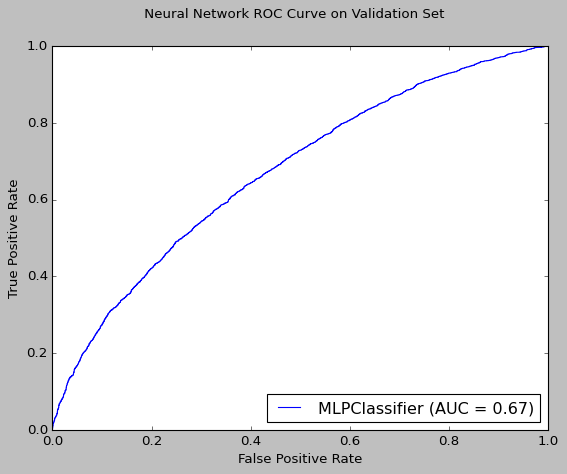

In [ ]:
nn_roc_plot = plot_roc_curve(nn, X_val, y_val)
nn_roc_plot.figure_.suptitle(' Neural Network ROC Curve on Validation Set')
plt.style.use('classic')
def resize_image(src_img, size=(120,120), bg_color="white"): 
    from PIL import Image
plt.show()

In [ ]:
from sklearn import svm
m_svm = svm.SVC()
m_svm.fit(X_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
y_pred_m_svm = m_svm.predict(X_val)

Confusion matrix:


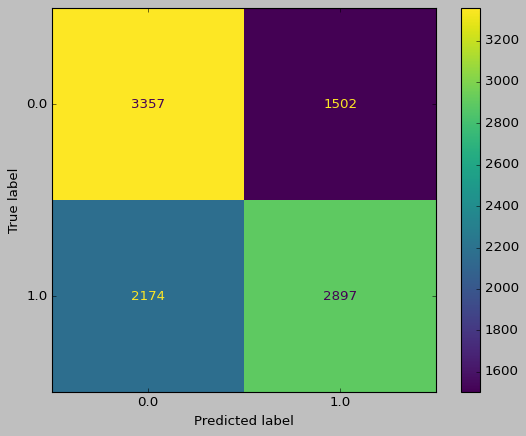

In [ ]:
from sklearn.metrics import plot_confusion_matrix
print('Confusion matrix:')
plot_confusion_matrix(m_svm, X_test, y_test,
                             values_format='d')
plt.style.use('classic')
def resize_image(src_img, size=(80,80), bg_color="white"): 
    from PIL import Image

plt.show()

In [ ]:
print(classification_report(y_val, y_pred_m_svm))

              precision    recall  f1-score   support

         0.0       0.61      0.67      0.64      3980
         1.0       0.64      0.57      0.60      3964

    accuracy                           0.62      7944
   macro avg       0.62      0.62      0.62      7944
weighted avg       0.62      0.62      0.62      7944



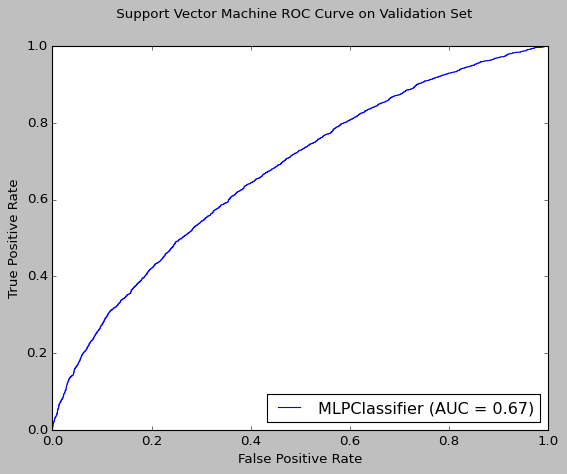

In [ ]:
m_svm_roc_plot = plot_roc_curve(nn, X_val, y_val)
m_svm_roc_plot.figure_.suptitle(' Support Vector Machine ROC Curve on Validation Set')
plt.style.use('classic')
def resize_image(src_img, size=(120,120), bg_color="white"): 
    from PIL import Image
plt.show()

## Evaluating Predictive Models

## Evaluating the performance of Logistic Regression Model using KeyToDataScience Visualization Library - kds

In [ ]:
y_prob_lr = lr.predict_proba(X_test)

LABELS INFO:

 prob_min         : Minimum probability in a particular decile
 prob_max         : Minimum probability in a particular decile
 prob_avg         : Average probability in a particular decile
 cnt_events       : Count of events in a particular decile
 cnt_resp         : Count of responders in a particular decile
 cnt_non_resp     : Count of non-responders in a particular decile
 cnt_resp_rndm    : Count of responders if events assigned randomly in a particular decile
 cnt_resp_wiz     : Count of best possible responders in a particular decile
 resp_rate        : Response Rate in a particular decile [(cnt_resp/cnt_cust)*100]
 cum_events       : Cumulative sum of events decile-wise 
 cum_resp         : Cumulative sum of responders decile-wise 
 cum_resp_wiz     : Cumulative sum of best possible responders decile-wise 
 cum_non_resp     : Cumulative sum of non-responders decile-wise 
 cum_events_pct   : Cumulative sum of percentages of events decile-wise 
 cum_resp_pct     : Cu

,decile,prob_min,prob_max,prob_avg,cnt_cust,cnt_resp,cnt_non_resp,cnt_resp_rndm,cnt_resp_wiz,resp_rate,cum_cust,cum_resp,cum_resp_wiz,cum_non_resp,cum_cust_pct,cum_resp_pct,cum_resp_pct_wiz,cum_non_resp_pct,KS,lift
0,1,0.713,0.828,0.760,993.0,772.0,221.0,507.1,993.0,77.744,993.0,772.0,993.0,221.0,10.0,15.224,19.582,4.548,10.676,1.522
1,2,0.638,0.713,0.674,993.0,679.0,314.0,507.1,993.0,68.379,1986.0,1451.0,1986.0,535.0,20.0,28.614,39.164,11.010,17.604,1.431
2,3,0.576,0.638,0.606,993.0,622.0,371.0,507.1,993.0,62.638,2979.0,2073.0,2979.0,906.0,30.0,40.880,58.746,18.646,22.234,1.363
3,4,0.521,0.576,0.548,993.0,601.0,392.0,507.1,993.0,60.524,3972.0,2674.0,3972.0,1298.0,40.0,52.731,78.328,26.713,26.018,1.318
4,5,0.478,0.521,0.499,993.0,493.0,500.0,507.1,993.0,49.648,4965.0,3167.0,4965.0,1798.0,50.0,62.453,97.910,37.003,25.450,1.249
5,6,0.438,0.478,0.458,993.0,477.0,516.0,507.1,106.0,48.036,5958.0,3644.0,5071.0,2314.0,60.0,71.860,100.000,47.623,24.237,1.198
6,7,0.405,0.438,0.422,993.0,423.0,570.0,507.1,0.0,42.598,6951.0,4067.0,5071.0,2884.0,70.0,80.201,100.000,59.354,20.847,1.146
7,8,0.369,0.405,0.387,993.0,375.0,618.0,507.1,0.0,37.764,7944.0,4442.0,5071.0,3502.0,80.0,87.596,100.000,72.072,15.524,1.095
8,9,0.324,0.369,0.348,993.0,332.0,661.0,507.1,0.0,33.434,8937.0,4774.0,5071.0,4163.0,90.0,94.143,100.000,85.676,8.467,1.046
9,10,0.190,0.324,0.283,993.0,297.0,696.0,507.1,0.0,29.909,9930.0,5071.0,5071.0,4859.0,100.0,100.000,100.000,100.000,0.000,1.000


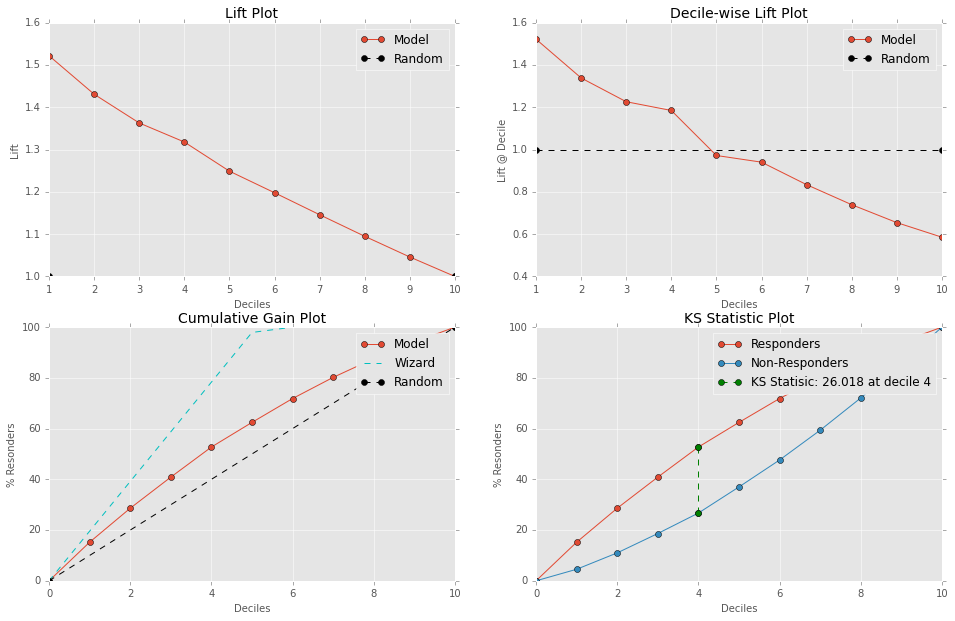

In [ ]:

kds.metrics.report(y_test, y_prob_lr[:,1],plot_style='ggplot')

Cumulative Gain plot and Lift plot show that how better off with using our model to predict defaulters instead of random. We are using Deciles which is a quantitative method of splitting up a set of ranked data into 10 equally large subsections.

## Evaluating performance of Logistic Regression Model using Decile Lift Chart

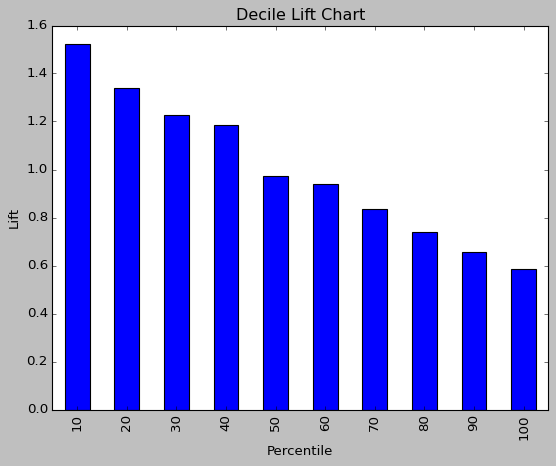

In [ ]:

df_lift = pd.DataFrame({'actual': y_test.values,'prob': lr.predict_proba(X_test)[:,1]})
df_lift = df_lift.sort_values(by=['prob'], ascending=False)

liftChart(df_lift.actual, labelBars=False)

Logistic Regression modle of Decile Lift Chart shows that we can still use the model to select the top 20% records with the highest propensities and still perform almost 1.25 times as well as random. Stair case shape of Decile Lift Chart shows that our Logistic Regression modle is stable in term of prediction.

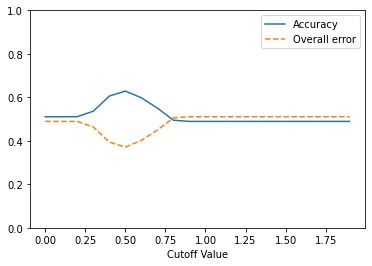

In [ ]:
cutoffs = [i * 0.1 for i in range(0, 20)]
accT = []
for cutoff in cutoffs:
    predicted = [1 if p > cutoff else 0 for p in  y_prob_lr[:,1]]
    accT.append(accuracy_score(y_test, predicted))

line_accuracy = plt.plot(cutoffs, accT, '-', label='Accuracy')[0]
line_error = plt.plot(cutoffs, [1 - acc for acc in accT], '--', label='Overall error')[0]
plt.ylim([0,1])
plt.xlabel('Cutoff Value')
plt.legend(handles=[line_accuracy, line_error])

plt.show()

In our logistic regression modeling, the cut-off point is the point that loan officers decide whether an applicant is a defaulter or not. If the probability becomes more than the cut-off point, an applicant is classified as a defaulter.

## Evaluating the performance of Random Forest Model using KeyToDataScience Visualization Library - kds

In [ ]:
y_prob_rf = rf.predict_proba(X_test)

LABELS INFO:

 prob_min         : Minimum probability in a particular decile
 prob_max         : Minimum probability in a particular decile
 prob_avg         : Average probability in a particular decile
 cnt_events       : Count of events in a particular decile
 cnt_resp         : Count of responders in a particular decile
 cnt_non_resp     : Count of non-responders in a particular decile
 cnt_resp_rndm    : Count of responders if events assigned randomly in a particular decile
 cnt_resp_wiz     : Count of best possible responders in a particular decile
 resp_rate        : Response Rate in a particular decile [(cnt_resp/cnt_cust)*100]
 cum_events       : Cumulative sum of events decile-wise 
 cum_resp         : Cumulative sum of responders decile-wise 
 cum_resp_wiz     : Cumulative sum of best possible responders decile-wise 
 cum_non_resp     : Cumulative sum of non-responders decile-wise 
 cum_events_pct   : Cumulative sum of percentages of events decile-wise 
 cum_resp_pct     : Cu

,decile,prob_min,prob_max,prob_avg,cnt_cust,cnt_resp,cnt_non_resp,cnt_resp_rndm,cnt_resp_wiz,resp_rate,cum_cust,cum_resp,cum_resp_wiz,cum_non_resp,cum_cust_pct,cum_resp_pct,cum_resp_pct_wiz,cum_non_resp_pct,KS,lift
0,1,0.76,0.98,0.830,993.0,737.0,256.0,507.1,993.0,74.220,993.0,737.0,993.0,256.0,10.0,14.534,19.582,5.269,9.265,1.453
1,2,0.68,0.76,0.719,993.0,662.0,331.0,507.1,993.0,66.667,1986.0,1399.0,1986.0,587.0,20.0,27.588,39.164,12.081,15.507,1.379
2,3,0.61,0.68,0.643,993.0,588.0,405.0,507.1,993.0,59.215,2979.0,1987.0,2979.0,992.0,30.0,39.184,58.746,20.416,18.768,1.306
3,4,0.56,0.61,0.583,993.0,585.0,408.0,507.1,993.0,58.912,3972.0,2572.0,3972.0,1400.0,40.0,50.720,78.328,28.813,21.907,1.268
4,5,0.50,0.56,0.529,993.0,486.0,507.0,507.1,993.0,48.943,4965.0,3058.0,4965.0,1907.0,50.0,60.304,97.910,39.247,21.057,1.206
5,6,0.45,0.50,0.475,993.0,478.0,515.0,507.1,106.0,48.137,5958.0,3536.0,5071.0,2422.0,60.0,69.730,100.000,49.846,19.884,1.162
6,7,0.39,0.45,0.420,993.0,446.0,547.0,507.1,0.0,44.914,6951.0,3982.0,5071.0,2969.0,70.0,78.525,100.000,61.103,17.422,1.122
7,8,0.33,0.39,0.358,993.0,403.0,590.0,507.1,0.0,40.584,7944.0,4385.0,5071.0,3559.0,80.0,86.472,100.000,73.246,13.226,1.081
8,9,0.24,0.33,0.286,993.0,374.0,619.0,507.1,0.0,37.664,8937.0,4759.0,5071.0,4178.0,90.0,93.847,100.000,85.985,7.862,1.043
9,10,0.01,0.24,0.171,993.0,312.0,681.0,507.1,0.0,31.420,9930.0,5071.0,5071.0,4859.0,100.0,100.000,100.000,100.000,0.000,1.000


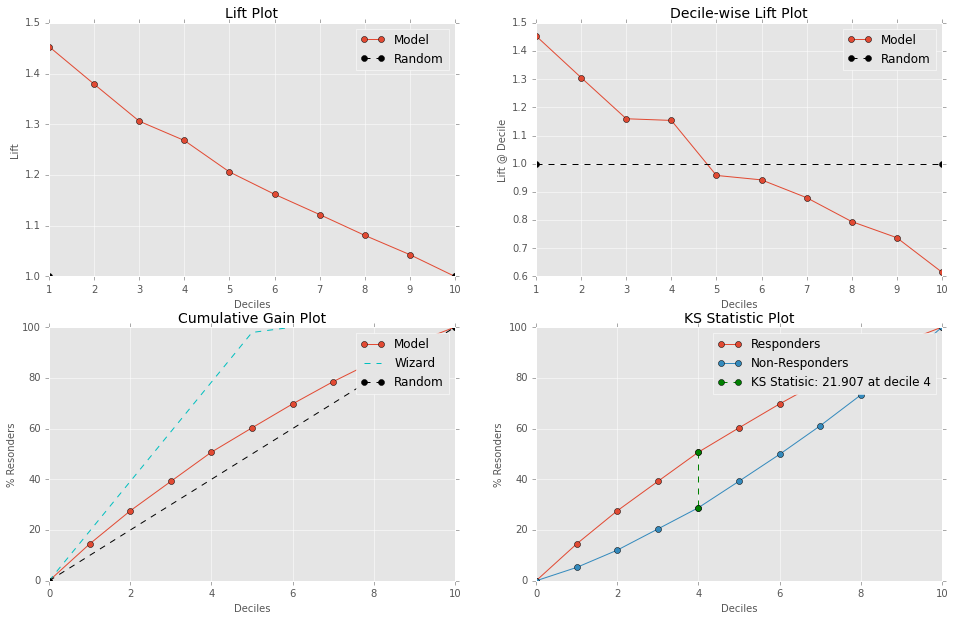

In [ ]:

kds.metrics.report(y_test, y_prob_rf[:,1],plot_style='ggplot')

Evaluating Random Forest model performance in term of ranking(lift)

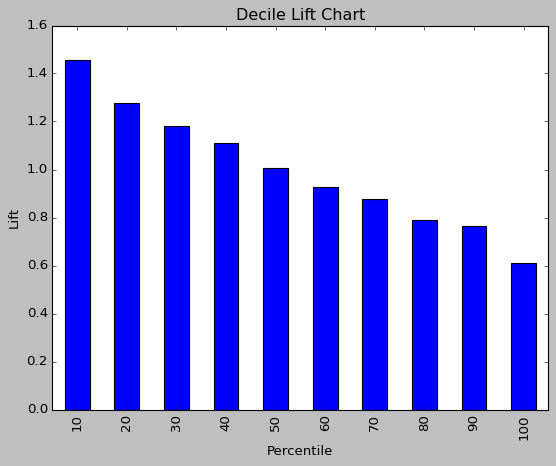

In [ ]:


df_lift = pd.DataFrame({'actual': y_test.values,'prob': rf.predict_proba(X_test)[:,1]})
df_lift = df_lift.sort_values(by=['prob'], ascending=False)

# df = pd.read_csv('./dmba/liftExample.csv')
# df = df.sort_values(by=['prob'], ascending=False) 
# # gainsChart(df.actual, figsize=(4, 4))

liftChart(df_lift.actual, labelBars=False)

Random Forest modle of Decile Lift Chart shows that we can still use the model to select the top 20% records with the highest propensities and still perform almost 1.25 times as well as random

## Evaluating the performance of Stochastic Gradient Boosting using KeyToDataScience Visualization Library - kds

In [ ]:
y_prob_sgbc = sgbc.predict_proba(X_test)

LABELS INFO:

 prob_min         : Minimum probability in a particular decile
 prob_max         : Minimum probability in a particular decile
 prob_avg         : Average probability in a particular decile
 cnt_events       : Count of events in a particular decile
 cnt_resp         : Count of responders in a particular decile
 cnt_non_resp     : Count of non-responders in a particular decile
 cnt_resp_rndm    : Count of responders if events assigned randomly in a particular decile
 cnt_resp_wiz     : Count of best possible responders in a particular decile
 resp_rate        : Response Rate in a particular decile [(cnt_resp/cnt_cust)*100]
 cum_events       : Cumulative sum of events decile-wise 
 cum_resp         : Cumulative sum of responders decile-wise 
 cum_resp_wiz     : Cumulative sum of best possible responders decile-wise 
 cum_non_resp     : Cumulative sum of non-responders decile-wise 
 cum_events_pct   : Cumulative sum of percentages of events decile-wise 
 cum_resp_pct     : Cu

,decile,prob_min,prob_max,prob_avg,cnt_cust,cnt_resp,cnt_non_resp,cnt_resp_rndm,cnt_resp_wiz,resp_rate,cum_cust,cum_resp,cum_resp_wiz,cum_non_resp,cum_cust_pct,cum_resp_pct,cum_resp_pct_wiz,cum_non_resp_pct,KS,lift
0,1,0.765,0.979,0.830,993.0,774.0,219.0,507.1,993.0,77.946,993.0,774.0,993.0,219.0,10.0,15.263,19.582,4.507,10.756,1.526
1,2,0.678,0.765,0.719,993.0,665.0,328.0,507.1,993.0,66.969,1986.0,1439.0,1986.0,547.0,20.0,28.377,39.164,11.257,17.120,1.419
2,3,0.611,0.678,0.644,993.0,646.0,347.0,507.1,993.0,65.055,2979.0,2085.0,2979.0,894.0,30.0,41.116,58.746,18.399,22.717,1.371
3,4,0.551,0.611,0.580,993.0,529.0,464.0,507.1,993.0,53.273,3972.0,2614.0,3972.0,1358.0,40.0,51.548,78.328,27.948,23.600,1.289
4,5,0.497,0.551,0.524,993.0,521.0,472.0,507.1,993.0,52.467,4965.0,3135.0,4965.0,1830.0,50.0,61.822,97.910,37.662,24.160,1.236
5,6,0.441,0.497,0.470,993.0,491.0,502.0,507.1,106.0,49.446,5958.0,3626.0,5071.0,2332.0,60.0,71.505,100.000,47.993,23.512,1.192
6,7,0.385,0.441,0.413,993.0,434.0,559.0,507.1,0.0,43.706,6951.0,4060.0,5071.0,2891.0,70.0,80.063,100.000,59.498,20.565,1.144
7,8,0.322,0.385,0.355,993.0,384.0,609.0,507.1,0.0,38.671,7944.0,4444.0,5071.0,3500.0,80.0,87.636,100.000,72.031,15.605,1.095
8,9,0.243,0.322,0.285,993.0,335.0,658.0,507.1,0.0,33.736,8937.0,4779.0,5071.0,4158.0,90.0,94.242,100.000,85.573,8.669,1.047
9,10,0.015,0.243,0.173,993.0,292.0,701.0,507.1,0.0,29.406,9930.0,5071.0,5071.0,4859.0,100.0,100.000,100.000,100.000,0.000,1.000


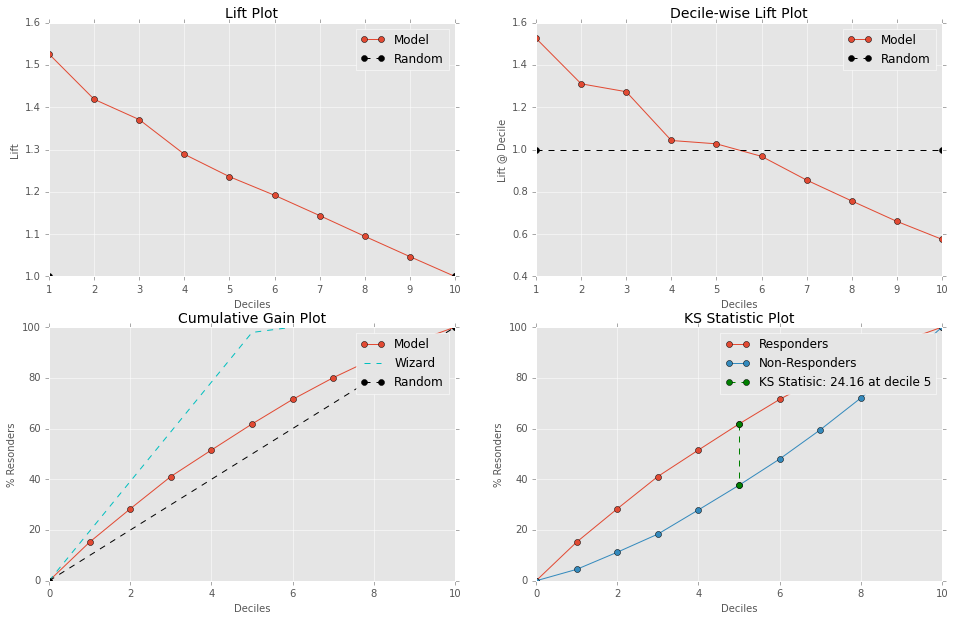

In [ ]:

kds.metrics.report(y_test, y_prob_sgbc[:,1],plot_style='ggplot')

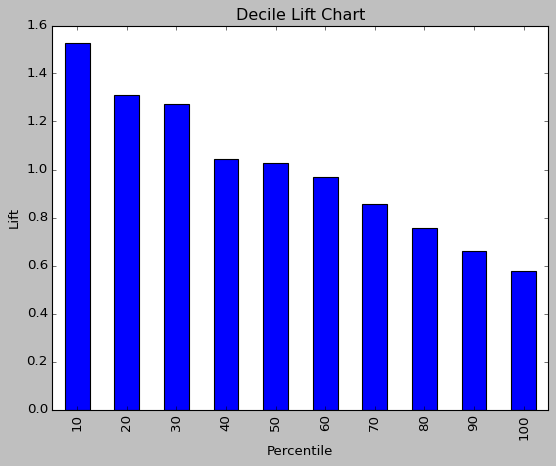

In [ ]:

df_lift = pd.DataFrame({'actual': y_test.values,'prob': sgbc.predict_proba(X_test)[:,1]})
df_lift = df_lift.sort_values(by=['prob'], ascending=False)
plt.style.use('classic')
def resize_image(src_img, size=(80,80), bg_color="white"): 
    from PIL import Image

liftChart(df_lift.actual, labelBars=False)

## Evaluating the performance of Neural Network using KeyToDataScience Visualization Library - kds

In [ ]:
y_prob_nn = nn.predict_proba(X_test)

In [ ]:
!pip install plotly

LABELS INFO:

 prob_min         : Minimum probability in a particular decile
 prob_max         : Minimum probability in a particular decile
 prob_avg         : Average probability in a particular decile
 cnt_events       : Count of events in a particular decile
 cnt_resp         : Count of responders in a particular decile
 cnt_non_resp     : Count of non-responders in a particular decile
 cnt_resp_rndm    : Count of responders if events assigned randomly in a particular decile
 cnt_resp_wiz     : Count of best possible responders in a particular decile
 resp_rate        : Response Rate in a particular decile [(cnt_resp/cnt_cust)*100]
 cum_events       : Cumulative sum of events decile-wise 
 cum_resp         : Cumulative sum of responders decile-wise 
 cum_resp_wiz     : Cumulative sum of best possible responders decile-wise 
 cum_non_resp     : Cumulative sum of non-responders decile-wise 
 cum_events_pct   : Cumulative sum of percentages of events decile-wise 
 cum_resp_pct     : Cu

,decile,prob_min,prob_max,prob_avg,cnt_cust,cnt_resp,cnt_non_resp,cnt_resp_rndm,cnt_resp_wiz,resp_rate,cum_cust,cum_resp,cum_resp_wiz,cum_non_resp,cum_cust_pct,cum_resp_pct,cum_resp_pct_wiz,cum_non_resp_pct,KS,lift
0,1,0.691,0.792,0.733,993.0,773.0,220.0,507.1,993.0,77.845,993.0,773.0,993.0,220.0,10.0,15.244,19.582,4.528,10.716,1.524
1,2,0.629,0.691,0.660,993.0,673.0,320.0,507.1,993.0,67.774,1986.0,1446.0,1986.0,540.0,20.0,28.515,39.164,11.113,17.402,1.426
2,3,0.570,0.629,0.598,993.0,632.0,361.0,507.1,993.0,63.646,2979.0,2078.0,2979.0,901.0,30.0,40.978,58.746,18.543,22.435,1.366
3,4,0.520,0.570,0.544,993.0,582.0,411.0,507.1,993.0,58.610,3972.0,2660.0,3972.0,1312.0,40.0,52.455,78.328,27.001,25.454,1.311
4,5,0.483,0.520,0.501,993.0,524.0,469.0,507.1,993.0,52.769,4965.0,3184.0,4965.0,1781.0,50.0,62.788,97.910,36.654,26.134,1.256
5,6,0.448,0.482,0.466,993.0,459.0,534.0,507.1,106.0,46.224,5958.0,3643.0,5071.0,2315.0,60.0,71.840,100.000,47.644,24.196,1.197
6,7,0.412,0.448,0.430,993.0,431.0,562.0,507.1,0.0,43.404,6951.0,4074.0,5071.0,2877.0,70.0,80.339,100.000,59.210,21.129,1.148
7,8,0.367,0.412,0.390,993.0,392.0,601.0,507.1,0.0,39.476,7944.0,4466.0,5071.0,3478.0,80.0,88.069,100.000,71.579,16.490,1.101
8,9,0.306,0.367,0.338,993.0,327.0,666.0,507.1,0.0,32.931,8937.0,4793.0,5071.0,4144.0,90.0,94.518,100.000,85.285,9.233,1.050
9,10,0.104,0.306,0.250,993.0,278.0,715.0,507.1,0.0,27.996,9930.0,5071.0,5071.0,4859.0,100.0,100.000,100.000,100.000,0.000,1.000


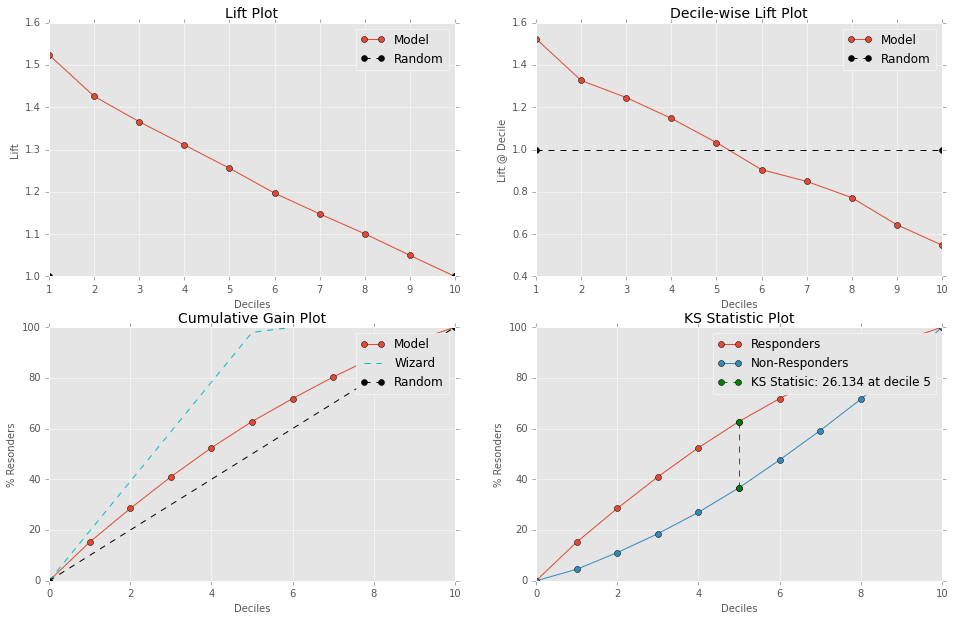

In [ ]:

kds.metrics.report(y_test, y_prob_nn[:,1],plot_style='ggplot')


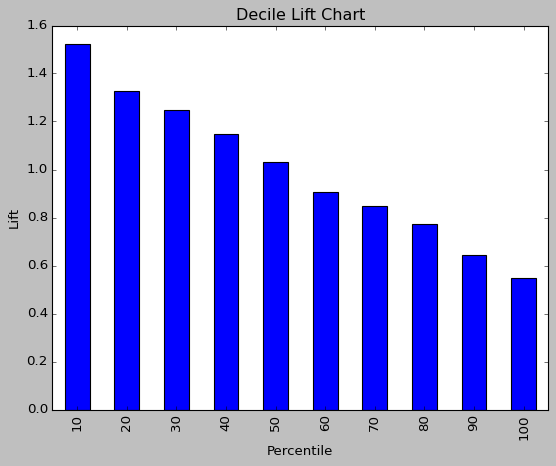

In [ ]:

df_lift = pd.DataFrame({'actual': y_test.values,'prob': nn.predict_proba(X_test)[:,1]})
df_lift = df_lift.sort_values(by=['prob'], ascending=False)
plt.style.use('classic')
def resize_image(src_img, size=(80,80), bg_color="white"): 
    from PIL import Image

liftChart(df_lift.actual, labelBars=False)

Text(0.5, 1.0, 'All models')

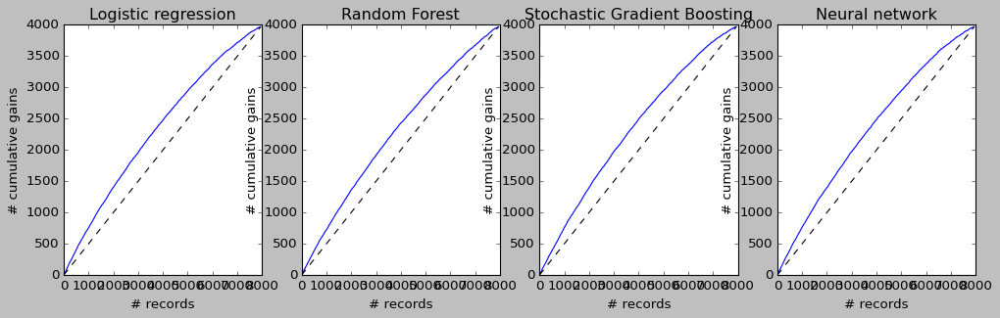

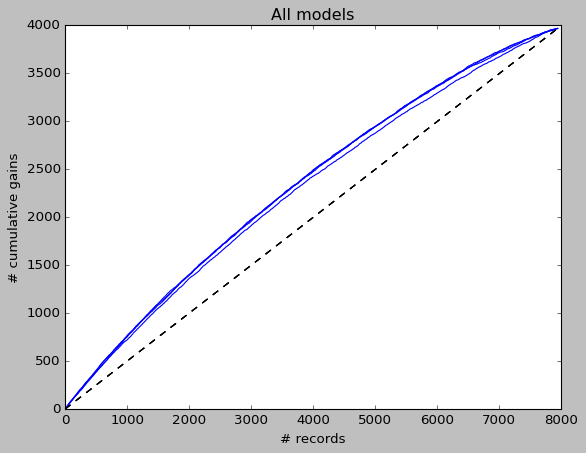

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(15, 4))

def modelGainsChart(model, title, ax=None):
    result = pd.DataFrame({
        'actual': y_val,
        'prob': model.predict_proba(X_val)[:, 1]
    })

    result = result.sort_values(by=['prob'], ascending=False).reset_index(drop=True)
    ax = gainsChart(result.actual, ax=ax)
    ax.set_title(title)
    return ax

modelGainsChart(lr, 'Logistic regression', axes[0])
modelGainsChart(rf, 'Random Forest', axes[1])
modelGainsChart(sgbc, 'Stochastic Gradient Boosting', axes[2])
modelGainsChart(nn, 'Neural network', axes[3])

ax = modelGainsChart(lr, 'Logistic regression')
modelGainsChart(rf, 'Random Forest', ax)
modelGainsChart(sgbc, 'Stochastic Gradient Boosting', ax)
modelGainsChart(nn, 'Neural network', ax)
ax.set_title('All models')

## Model Selection